In [2]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from pyuvdata import UVData, UVCal

In [3]:
import scipy

In [4]:
import polcal

In [5]:
import copy

In [6]:
import time

In [7]:
import glob

In [8]:
from scipy import interpolate

## Selecting Simulation Data And Raw Data  

Exclude `bad' antennas

In [11]:
good_ants = list(set([9,10,20,22,31,43,53,64,65,72,80,81,88,89,96,97,104,105,112]) - set([22,43,80,81]))

In [9]:
uvd_raw = UVData()
uvd_raw.read(glob.glob('/lustre/aoc/projects/hera/jaguirre/HERA19Summer2020/RawData/2457548/zen.2457548.16694.uvcRP.uvh5'), antenna_nums=good_ants)

In [10]:
uvd_sim = UVData()
uvd_sim.read(glob.glob('/lustre/aoc/projects/hera/jaguirre/HERA19Summer2020/Simulation/zen.2457755.59672.uvCP.uvh5'), antenna_nums=good_ants)

In [11]:
#print(np.unique(uvd_raw_.time_array), np.unique(uvd_raw_.lst_array), np.mean(np.diff(np.unique(uvd_raw_.time_array))), uvd_raw_.Ntimes)

In [12]:
#print(np.unique(uvd_sim_.time_array), np.unique(uvd_sim_.lst_array), np.mean(np.diff(np.unique(uvd_sim_.time_array))), uvd_sim_.Ntimes)

#### select the time_range

In [11]:
sim_start_idx = np.argwhere(np.unique(uvd_sim.lst_array)>np.unique(uvd_raw.lst_array)[0])[0]
print(sim_start_idx)
sim_start = np.unique(uvd_sim.time_array)[sim_start_idx][0]
print(np.unique(uvd_sim.lst_array)[sim_start_idx][0])
sim_end = np.unique(uvd_sim.time_array)[-1]
print(np.unique(uvd_sim.lst_array)[-1])

[19]
2.775733595166588
2.8077241081376183


In [12]:
raw_end_idx = np.argwhere(np.unique(uvd_raw.lst_array)<np.unique(uvd_sim.lst_array)[-1])[-1]
print(raw_end_idx)
raw_end = np.unique(uvd_raw.time_array)[raw_end_idx][0]
print(np.unique(uvd_raw.lst_array)[raw_end_idx][0])
raw_start = np.unique(uvd_raw.time_array)[0]
print(np.unique(uvd_raw.lst_array)[0])

[41]
2.8073953800665876
2.775292995261077


#### Make 'phased' copy and convert to uvfits

In [23]:
uvd_raw_copy = copy.deepcopy(uvd_raw)

In [24]:
uvd_sim_copy = copy.deepcopy(uvd_sim)

In [25]:
uvd_raw_copy.phase_to_time(raw_start)

In [26]:
uvd_sim_copy.phase_to_time(sim_start)

In [27]:
print(uvd_raw_copy.phase_center_dec_degrees,uvd_raw_copy.phase_center_ra_degrees)

-30.63243747022536 158.82193200367004


In [28]:
print(uvd_sim_copy.phase_center_dec_degrees,uvd_sim_copy.phase_center_ra_degrees)

-30.635068086176993 158.83656282988696


## Apply Smirnov method on single frequency channel

In [56]:
uv_polcal = uvdata_pol_calibrator(model_data=uvd_sim, real_data=uvd_raw, mode="model_based")

In [57]:
sim_start-1e-5, sim_end+1e-5

(2457755.599121639, 2457755.6042191857)

In [58]:
raw_start-1e-5,raw_end+1e-5

(2457548.166989404, 2457548.1721047065)

In [59]:
freq = 500
uv_polcal.data_slice(base_time_range=[sim_start-1e-5, sim_end+1e-5], prod_time_range=[raw_start-1e-5,raw_end+1e-5], 
                             base_freq_range=[freq], prod_freq_range=[freq], use_all_ants=True)
start_time = time.time()
gain_array_iter, residuals = uv_polcal.Wirtinger_lm_cal(damping_para=2., update_damping_para_per_loop=True, Niteration=1000, verbose=True)
print("--- %s seconds ---" % (time.time() - start_time))

--- 32.734663248062134 seconds ---


#### residuals vs iterations

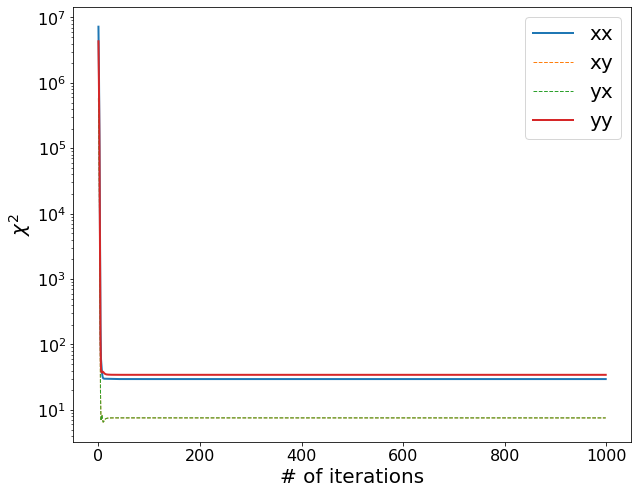

In [62]:
fig, ax = plt.subplots(figsize=(10,8))
ax.plot(residuals[:,0,0], lw=2, label="xx")
ax.plot(residuals[:,0,1], "--", lw=1,label="xy")
ax.plot(residuals[:,1,0], "--", lw=1, label="yx")
ax.plot(residuals[:,1,1], lw=2, label="yy")
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_ylabel(r"$\chi^2$", fontsize=20)
ax.set_xlabel("# of iterations", fontsize=20)
ax.legend(loc='best', fontsize=20)

#### convergence of recovered gains

Text(0.5, 0, '# of iterations')

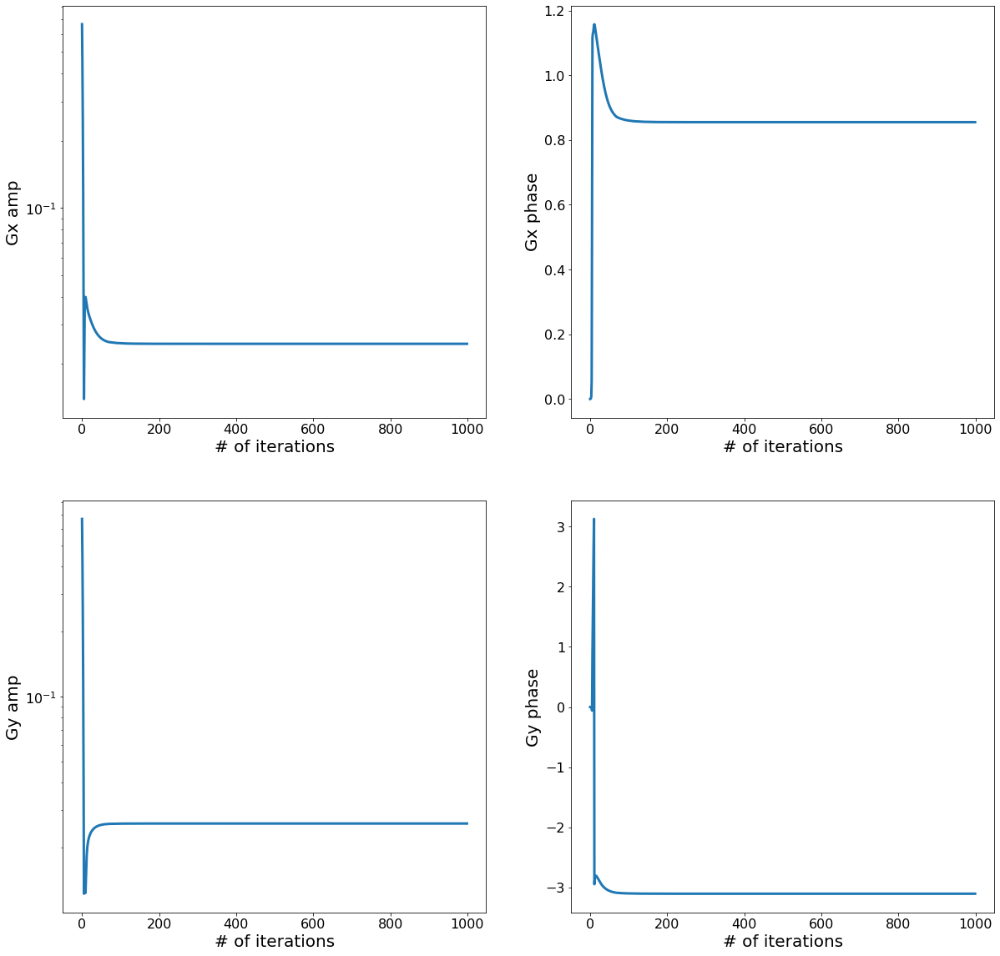

In [65]:
fig, axes = plt.subplots(figsize=(20,20), ncols=2, nrows=2)

ax = axes[0,0]
ax.plot(abs(gain_array_iter[:,0,0,0]), lw=3)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_ylabel("Gx amp", fontsize=20)
ax.set_xlabel("# of iterations", fontsize=20)

ax = axes[0,1]
ax.plot(np.angle(gain_array_iter[:,0,0,0]) , lw=3)
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_ylabel("Gx phase", fontsize=20)
ax.set_xlabel("# of iterations", fontsize=20)

ax = axes[1,0]
ax.plot(abs(gain_array_iter[:,0,1,1]), lw=3)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_ylabel("Gy amp", fontsize=20)
ax.set_xlabel("# of iterations", fontsize=20)

ax = axes[1,1]
ax.plot(np.angle(gain_array_iter[:,0,1,1]) , lw=3)
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_ylabel("Gy phase", fontsize=20)
ax.set_xlabel("# of iterations", fontsize=20)

Text(0.5, 0, '# of iterations')

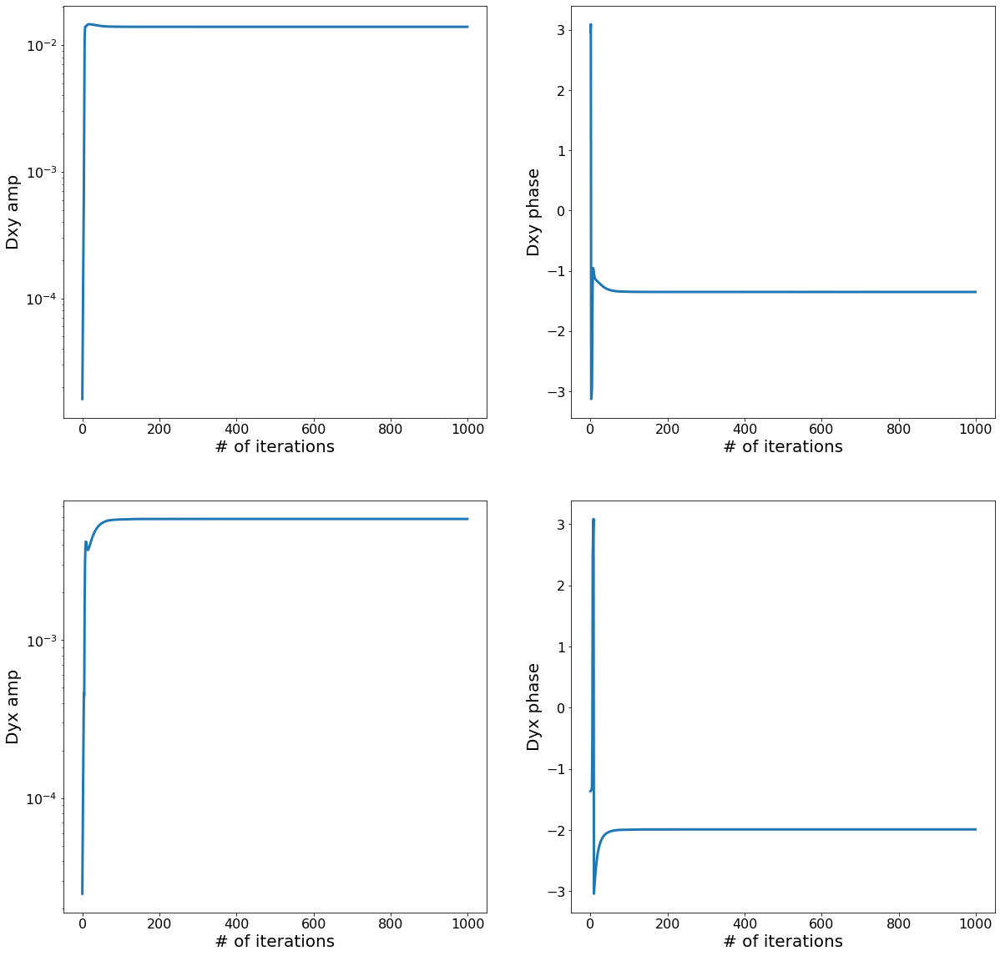

In [66]:
fig, axes = plt.subplots(figsize=(20,20), ncols=2, nrows=2)

ax = axes[0,0]
ax.plot(abs(gain_array_iter[:,10,0,1]), lw=3)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_ylabel("Dxy amp", fontsize=20)
ax.set_xlabel("# of iterations", fontsize=20)

ax = axes[0,1]
ax.plot(np.angle(gain_array_iter[:,10,0,1]) , lw=3)
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_ylabel("Dxy phase", fontsize=20)
ax.set_xlabel("# of iterations", fontsize=20)

ax = axes[1,0]
ax.plot(abs(gain_array_iter[:,10,1,0]), lw=3)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_ylabel("Dyx amp", fontsize=20)
ax.set_xlabel("# of iterations", fontsize=20)

ax = axes[1,1]
ax.plot(np.angle(gain_array_iter[:,10,1,0]) , lw=3)
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_ylabel("Dyx phase", fontsize=20)
ax.set_xlabel("# of iterations", fontsize=20)

#### Plot antenna position

In [71]:
antpos, ants = uvd_raw.get_ENU_antpos(center=True, pick_data_ants=False)

In [84]:
good_antpos = []
for good_ant in good_ants:
    good_antpos.extend(antpos[np.where(ants == good_ant)])
good_antpos = np.array(good_antpos)

Text(0, 0.5, 'Y-position [meters]')

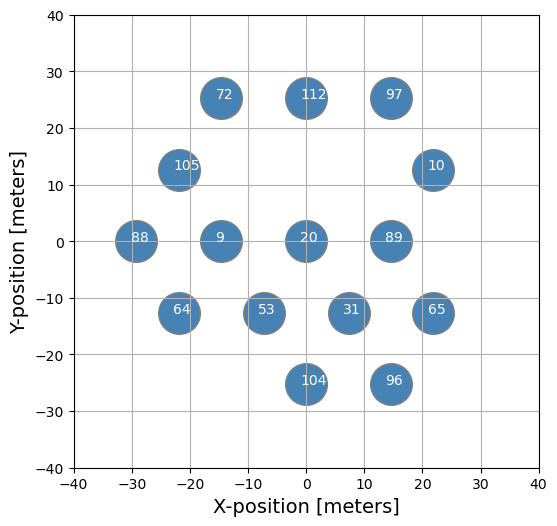

In [91]:
# plot array
fig, ax = plt.subplots(figsize=(6, 6), dpi=100)
ax.grid()
ax.scatter(good_antpos[:, 0], good_antpos[:, 1], edgecolor='grey', facecolor='steelblue', s=900)
for i in range(len(good_ants)): ax.text(good_antpos[i,0]-1, good_antpos[i,1], good_ants[i], fontsize=10, color='w')
ax.set_xlim(-40, 40)
ax.set_ylim(-40, 40)
ax.set_xlabel("X-position [meters]", fontsize=14)
ax.set_ylabel("Y-position [meters]", fontsize=14)

## Gains on the whole band

In [9]:
 gain_info = np.load("gain_info_HERA19_wholeband.npy")

In [1]:
## run in every frequency channel

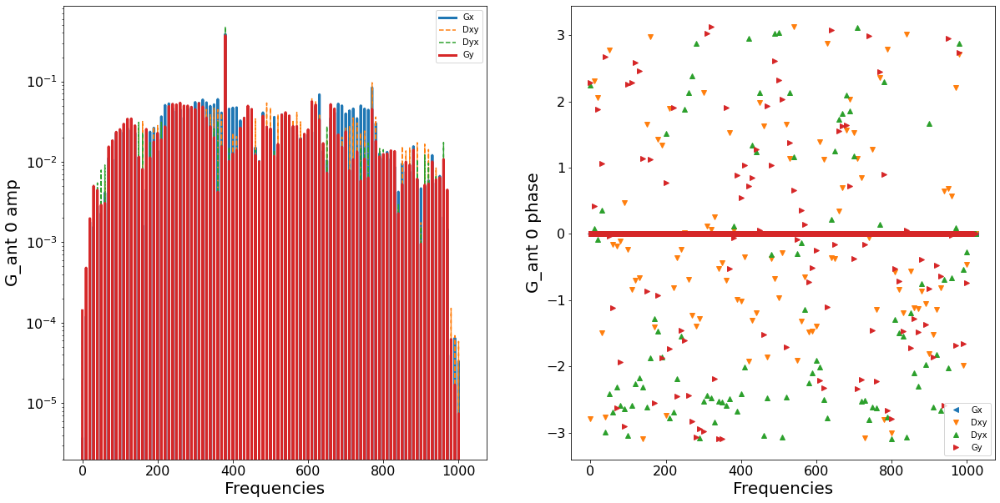

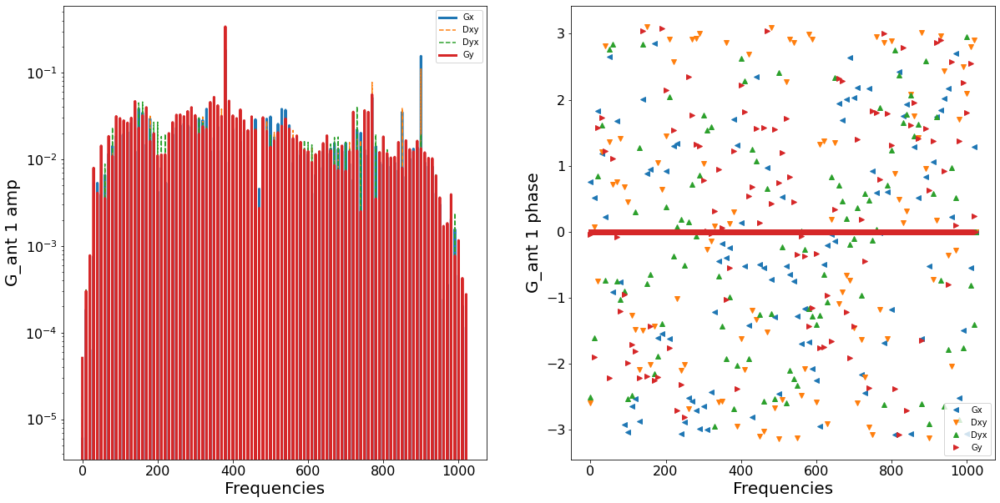

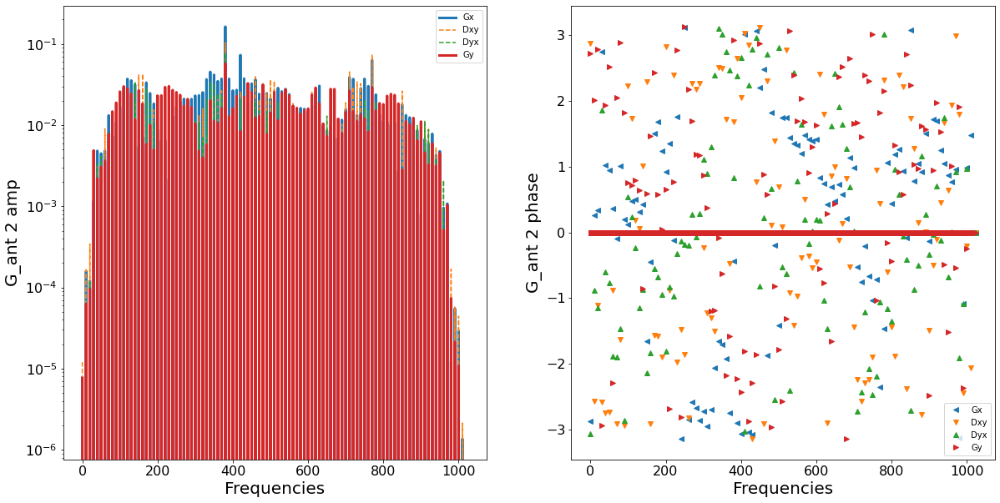

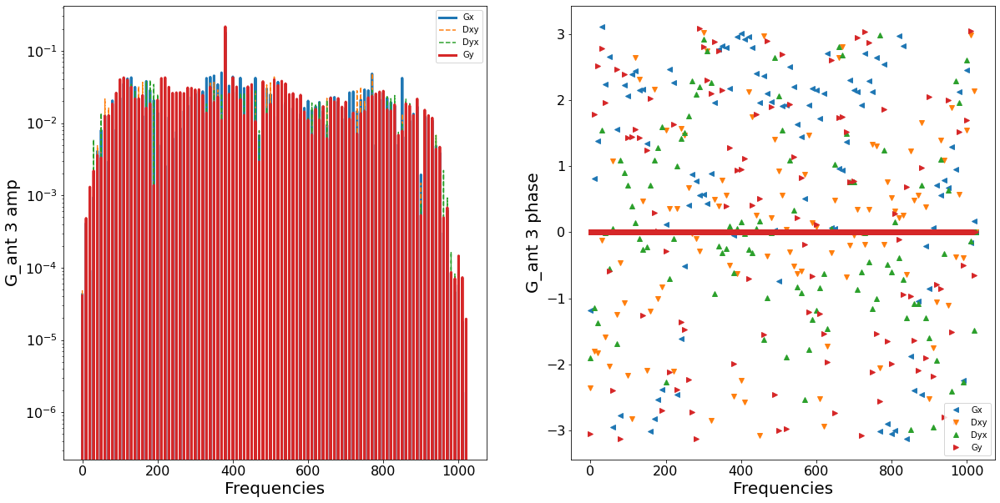

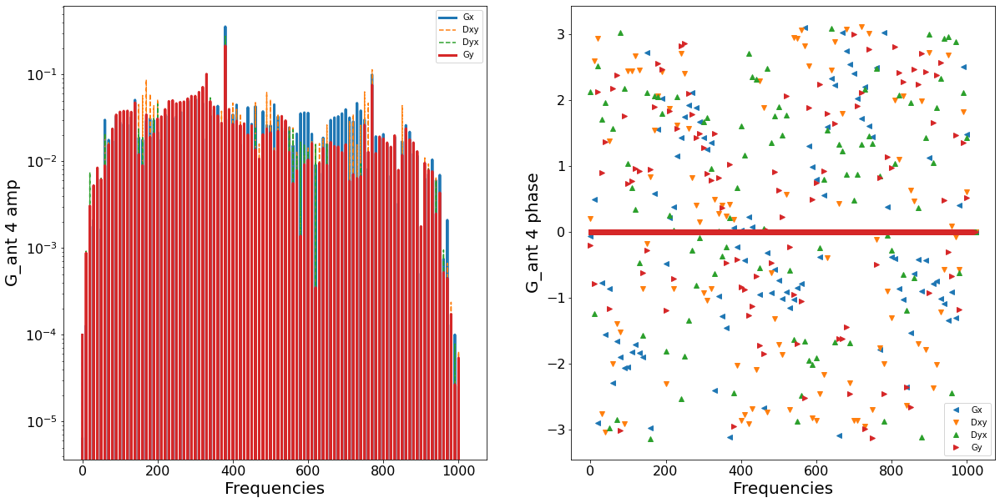

...

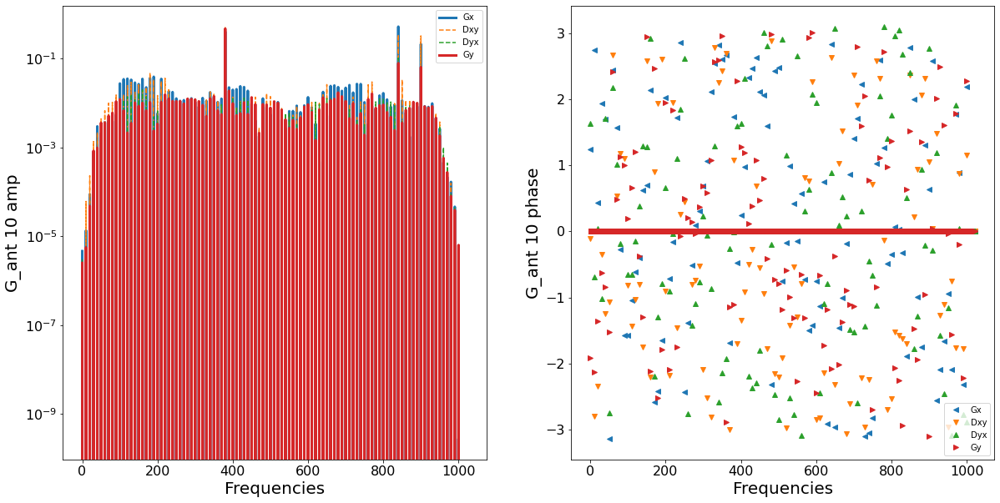

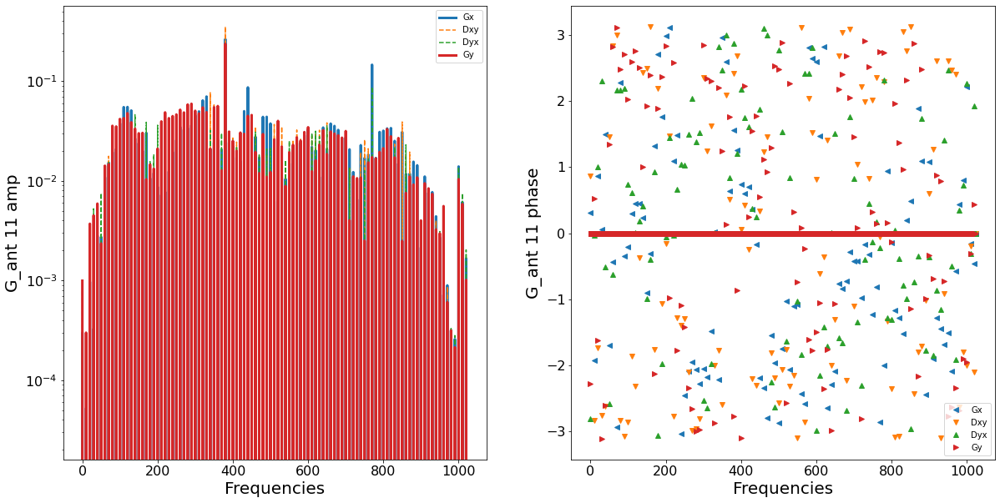

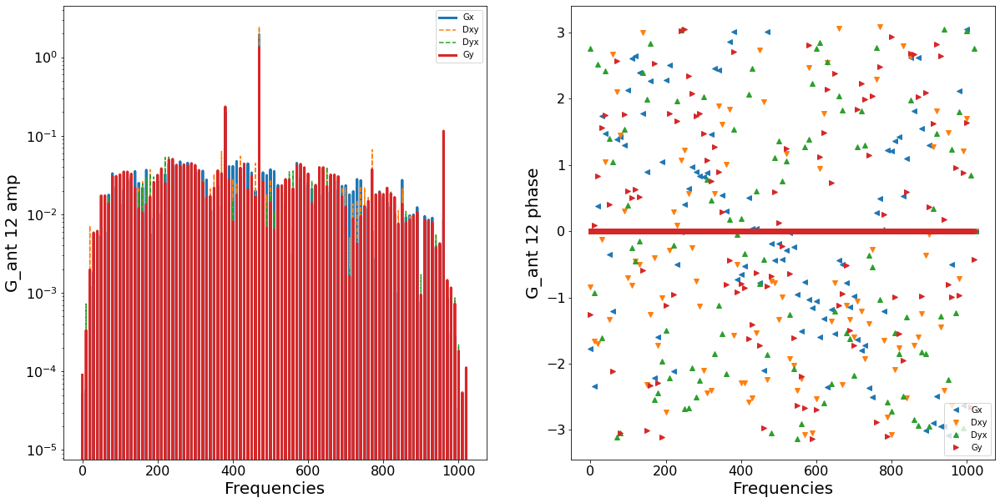

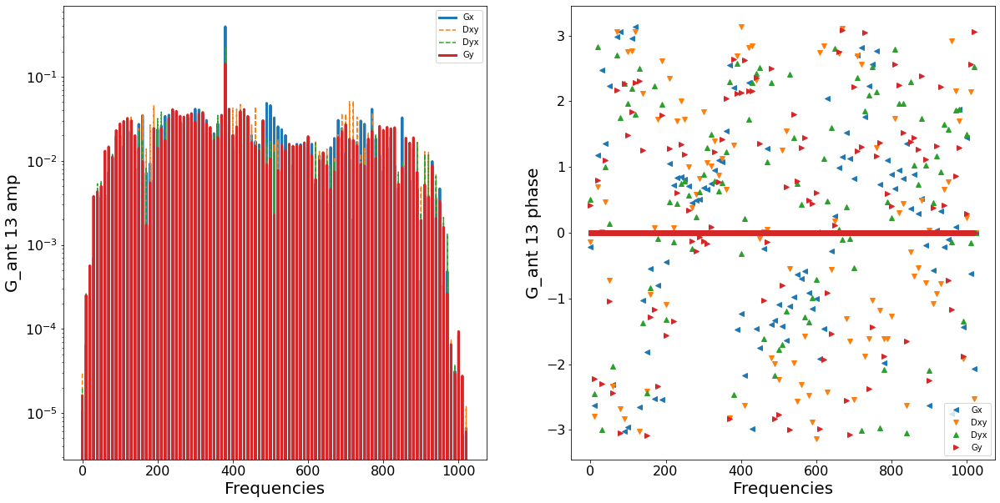

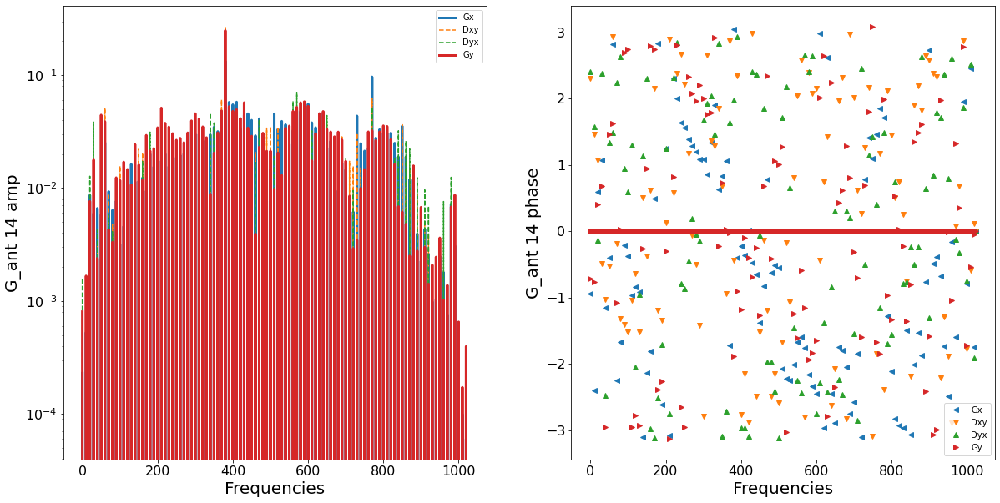

In [27]:
for ant_index in range(gain_info.shape[0]):
    fig, axes = plt.subplots(figsize=(20,10), ncols=2)
    
    ax = axes[0]
    ax.plot(abs(gain_info[ant_index,:,0,0]), lw=3, label="Gx")
    ax.plot(abs(gain_info[ant_index,:,0,1]), "--", label="Dxy")
    ax.plot(abs(gain_info[ant_index,:,1,0]), "--", label="Dyx")
    ax.plot(abs(gain_info[ant_index,:,1,1]), lw=3, label="Gy")
    ax.set_yscale('log')
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} amp".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')
    
    ax = axes[1]
    ax.plot(np.angle(gain_info[ant_index,:,0,0]), "<", label="Gx")
    ax.plot(np.angle(gain_info[ant_index,:,0,1]), "v",label="Dxy")
    ax.plot(np.angle(gain_info[ant_index,:,1,0]), "^",label="Dyx")
    ax.plot(np.angle(gain_info[ant_index,:,1,1]), ">",label="Gy")
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} phase".format(ant_index), fontsize=20)
    ax.legend(loc='lower right')

### convergence of residuals

In [28]:
 residuals = np.load("residual_iterations_wholeband.npy")

Text(0, 0.5, 'Vyy')

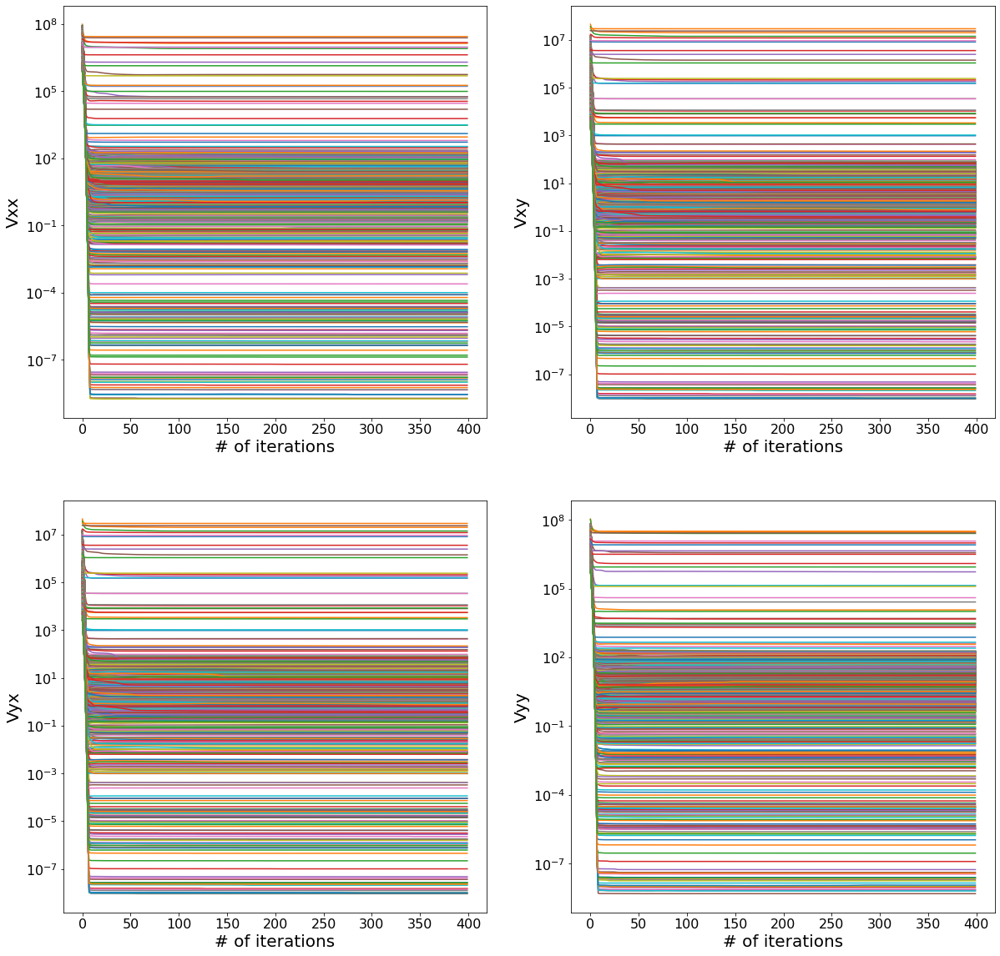

In [35]:
fig, axes = plt.subplots(figsize=(20,20), ncols=2, nrows=2)

ax = axes[0,0]
ax.plot(residuals[:,:,0,0].T)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_xlabel("# of iterations", fontsize=20)
ax.set_ylabel("Vxx".format(ant_index), fontsize=20)

ax = axes[0,1]
ax.plot(residuals[:,:,0,1].T)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_xlabel("# of iterations", fontsize=20)
ax.set_ylabel("Vxy".format(ant_index), fontsize=20)

ax = axes[1,0]
ax.plot(residuals[:,:,1,0].T)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_xlabel("# of iterations", fontsize=20)
ax.set_ylabel("Vyx".format(ant_index), fontsize=20)

ax = axes[1,1]
ax.plot(residuals[:,:,1,1].T)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_xlabel("# of iterations", fontsize=20)
ax.set_ylabel("Vyy".format(ant_index), fontsize=20)

### comparison with other gains

In [12]:
uv_cal = UVCal()
uv_cal.read_calfits("/lustre/aoc/projects/hera/jaguirre/HERA19Summer2020/RawData/2457548/zen.2457548.16694.uvcRP.calfits")
uv_cal.select(antenna_nums=good_ants, times=uv_cal.time_array[:42])

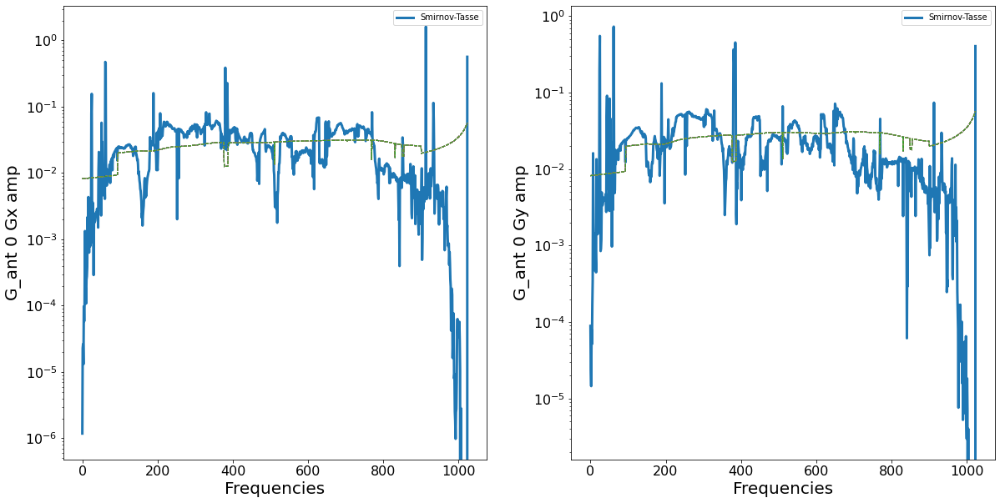

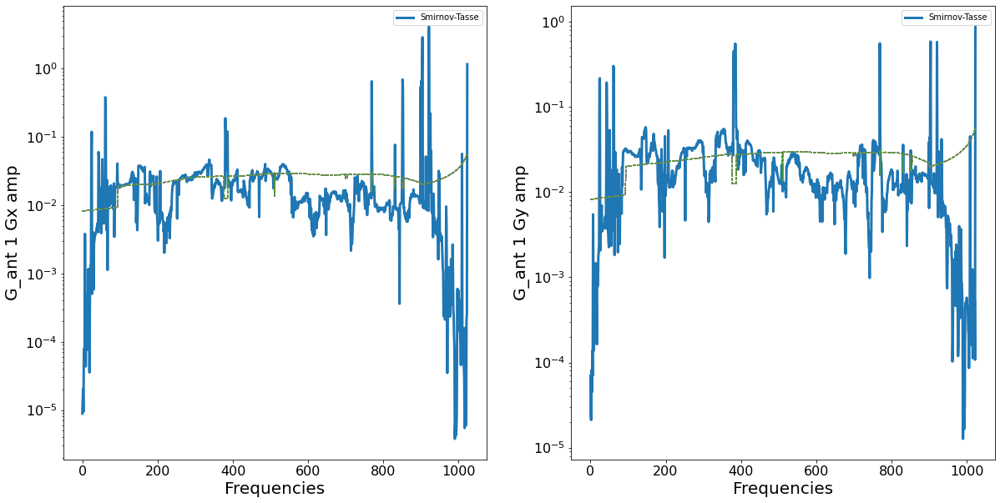

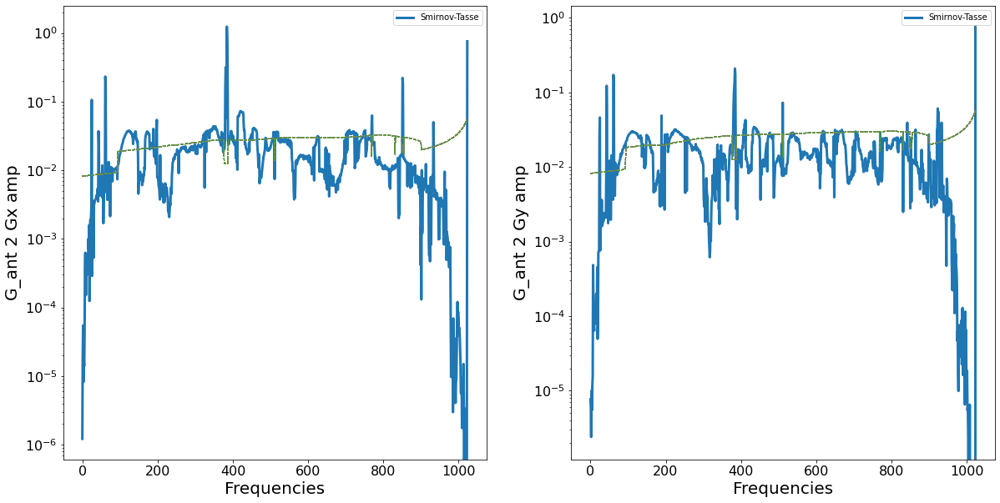

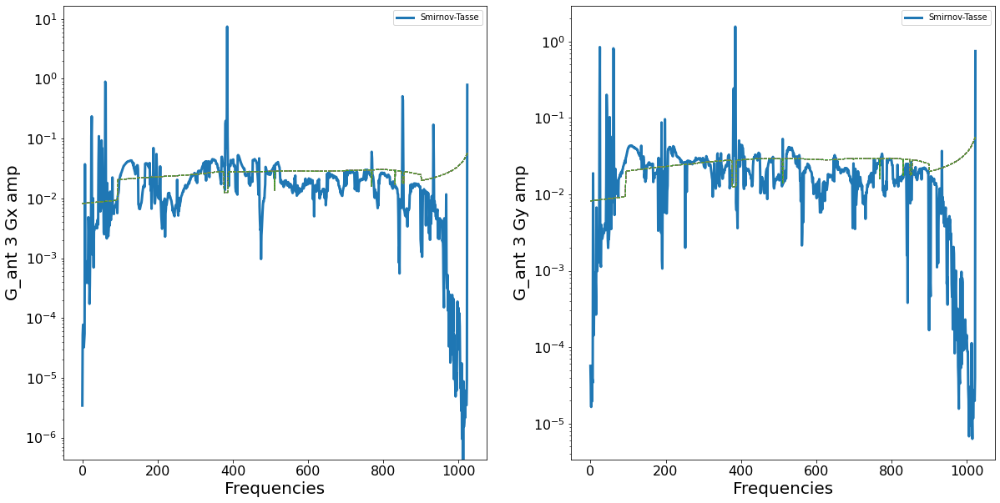

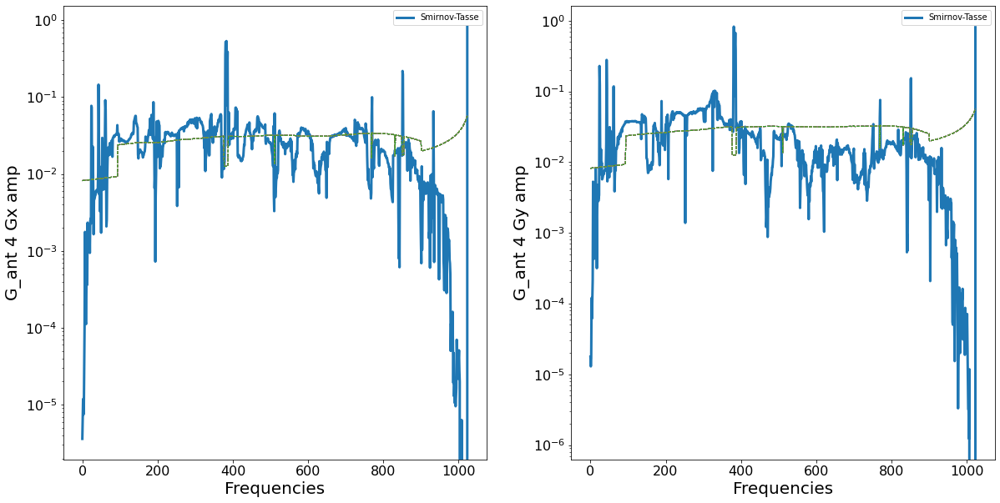

...

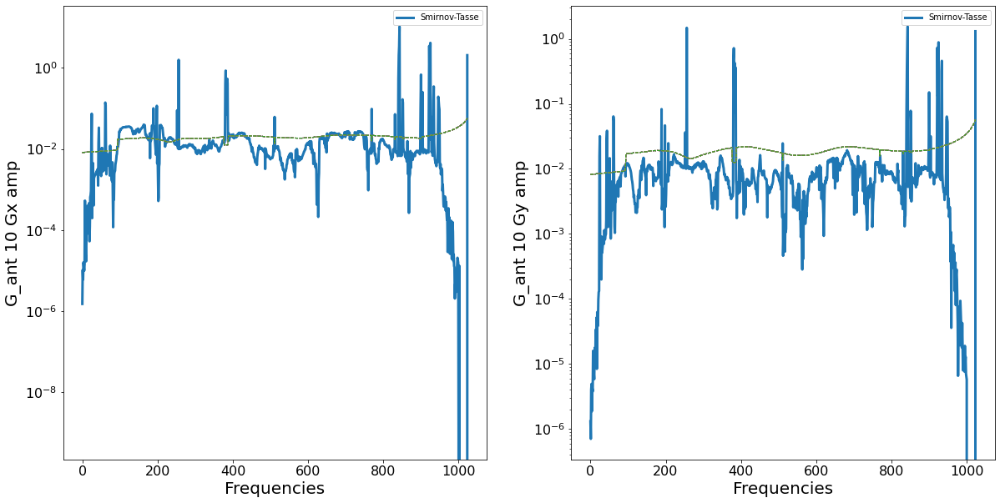

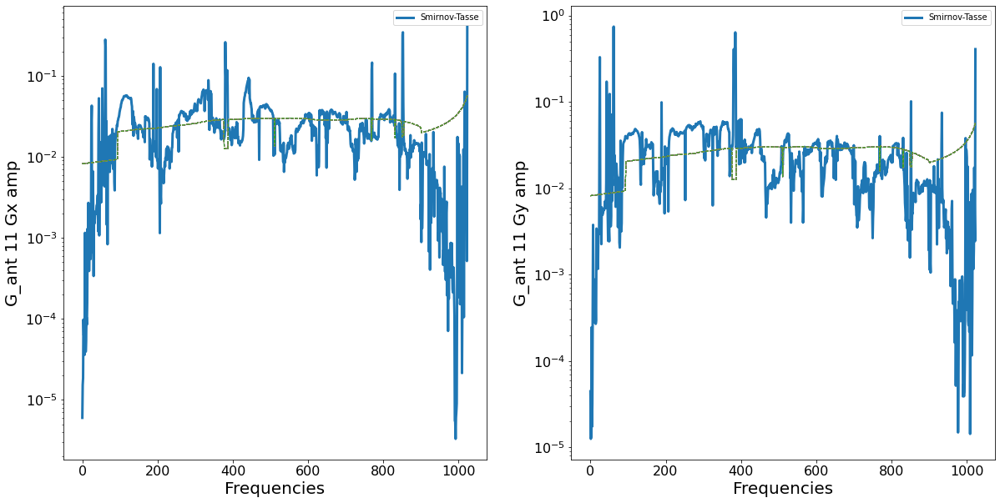

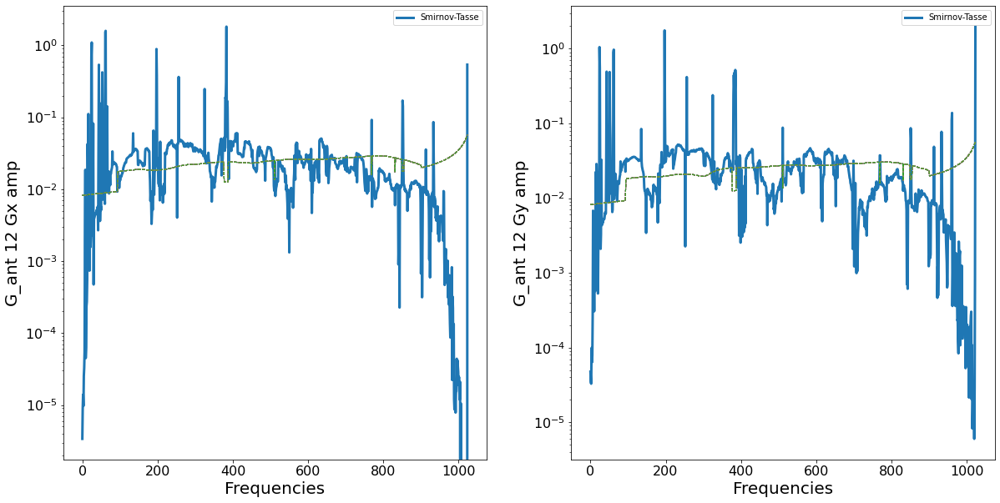

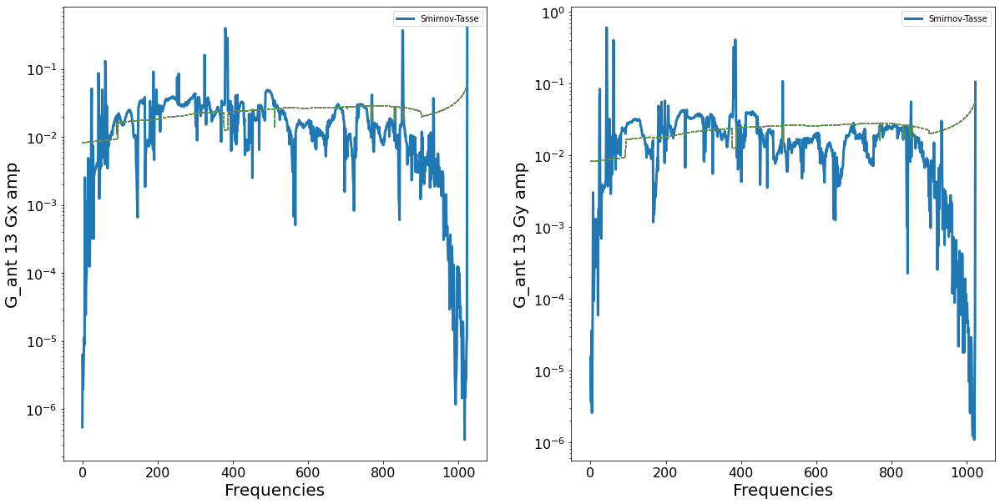

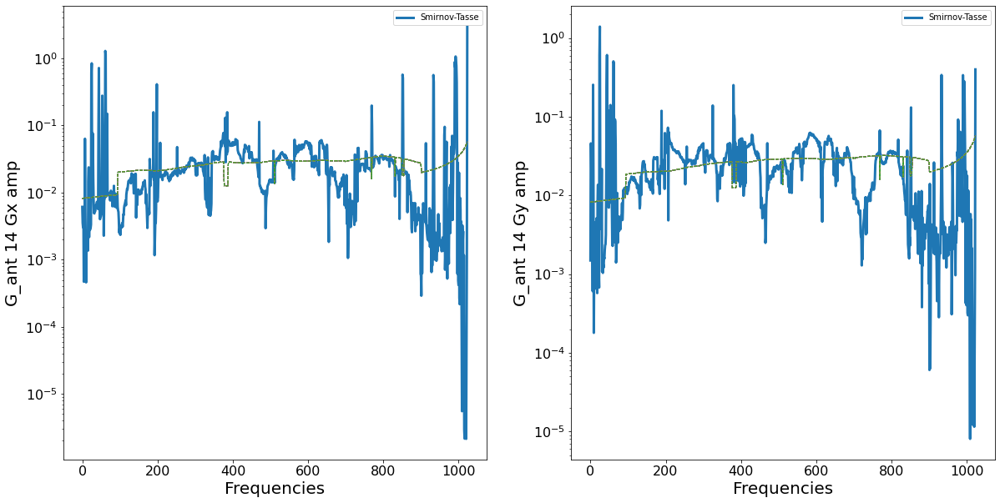

In [15]:
for ant_index in range(gain_info.shape[0]):
    fig, axes = plt.subplots(figsize=(20,10), ncols=2)
    
    ax = axes[0]
    ax.plot(abs(gain_info[ant_index,:,0,0]), lw=3, label="Smirnov-Tasse")
    ax.plot(abs(uv_cal.gain_array[ant_index,0,:,:,0]), "--", lw=1)
    ax.set_yscale('log')
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} Gx amp".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')
    
    ax = axes[1]
    ax.plot(abs(gain_info[ant_index,:,1,1]), lw=3, label="Smirnov-Tasse")
    ax.plot(abs(uv_cal.gain_array[ant_index,0,:,:,1]), "--", lw=1)
    ax.set_yscale('log')
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} Gy amp".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')
    

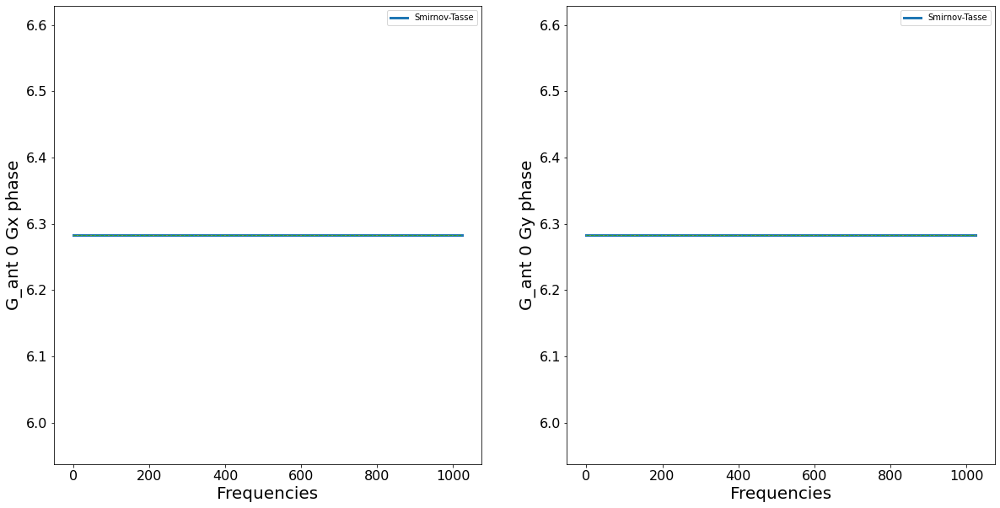

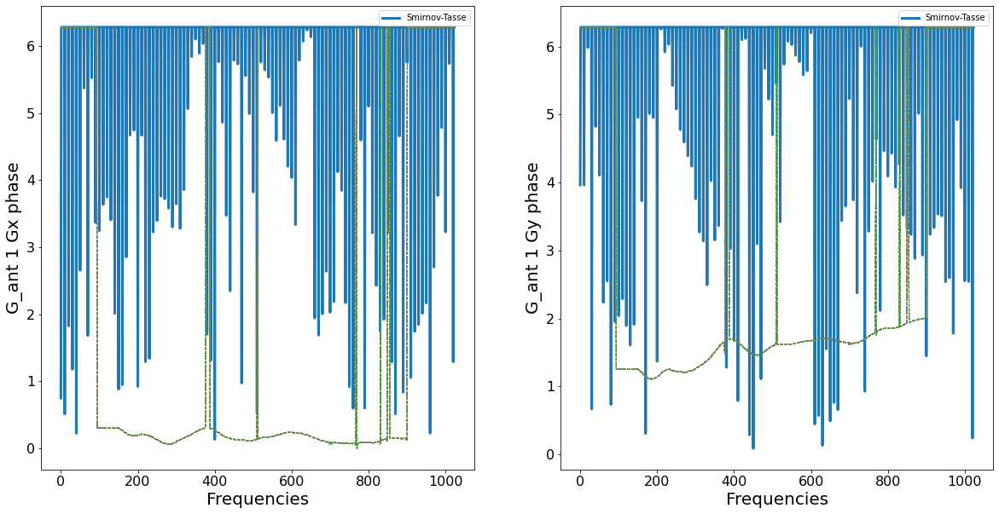

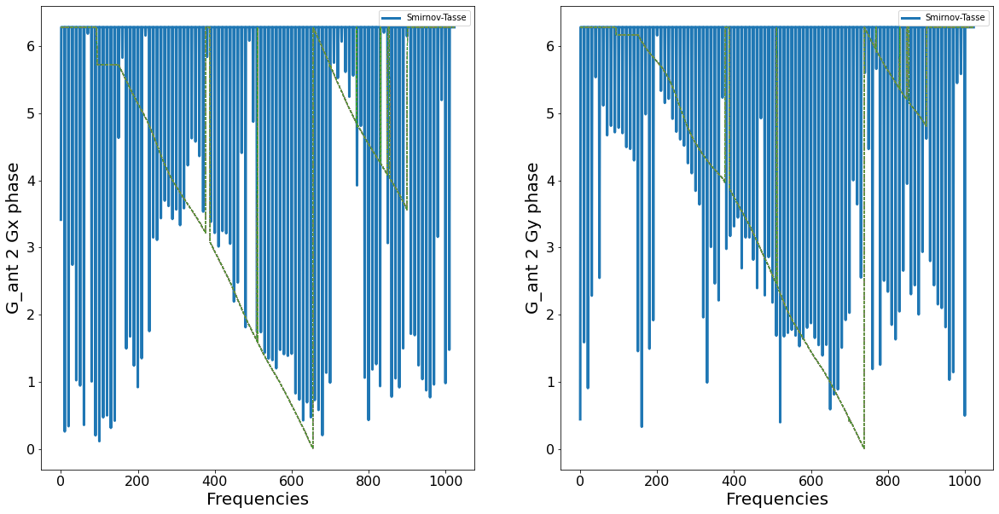

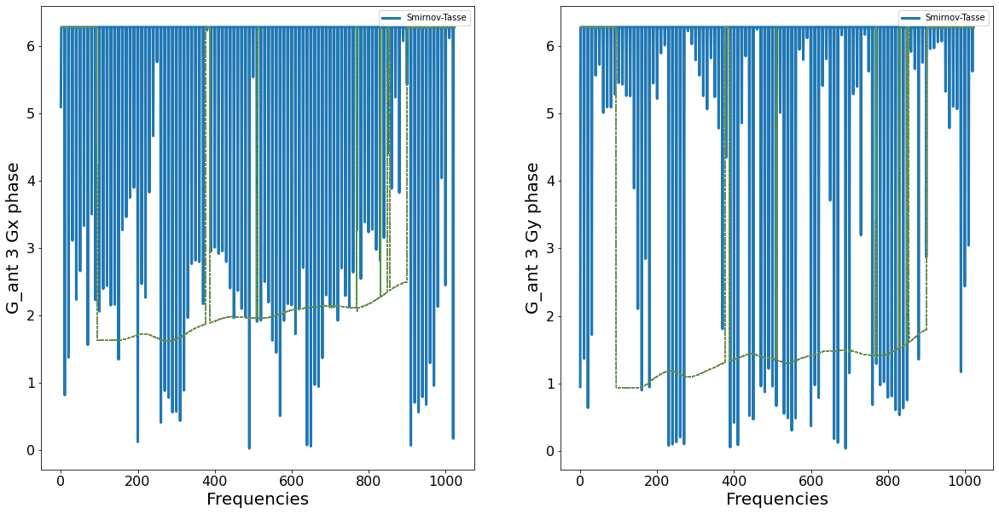

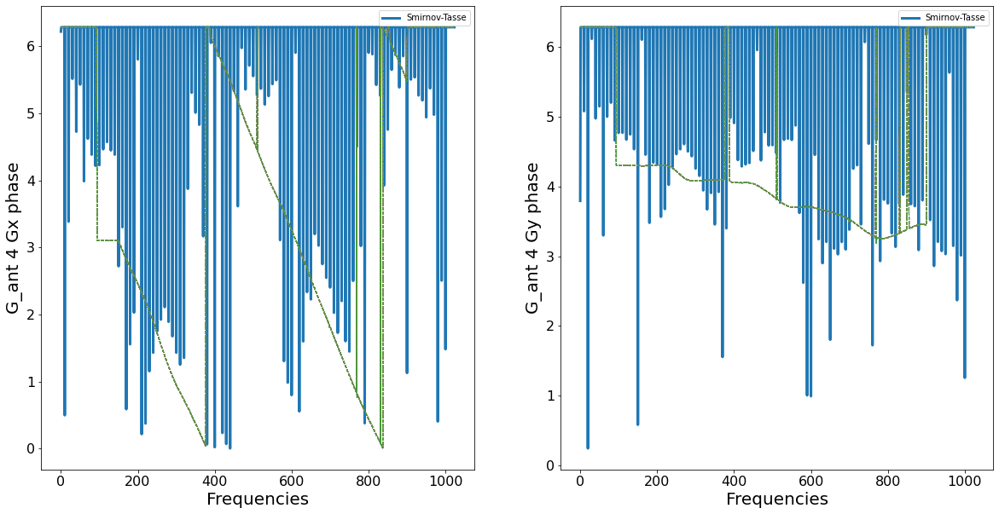

...

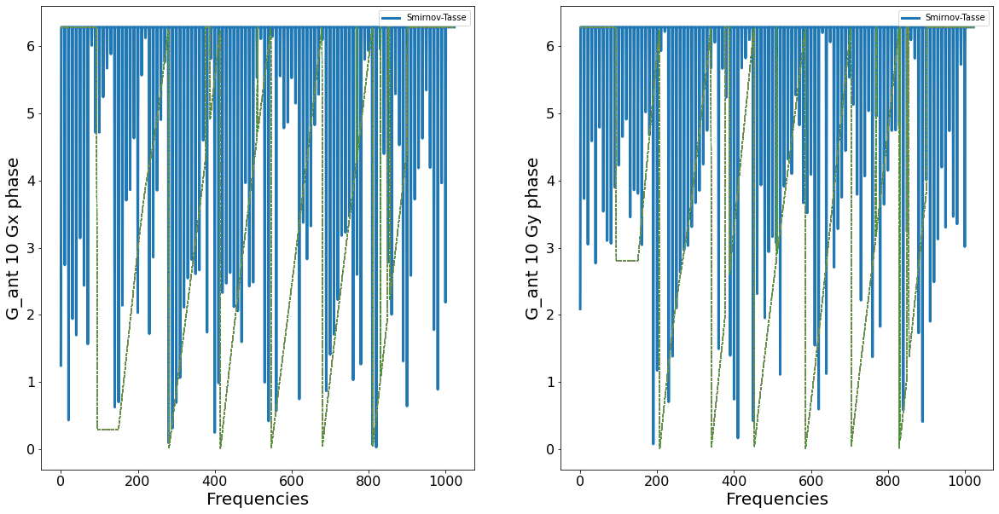

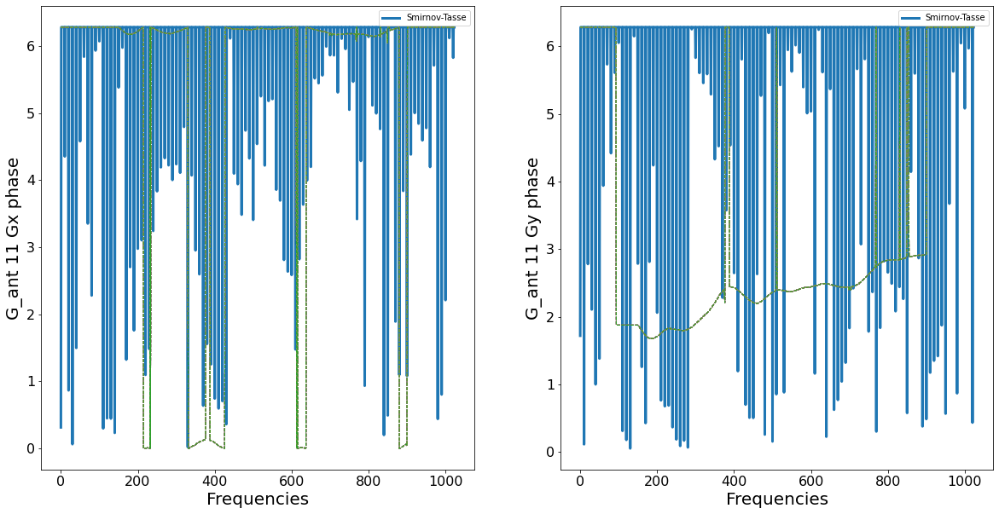

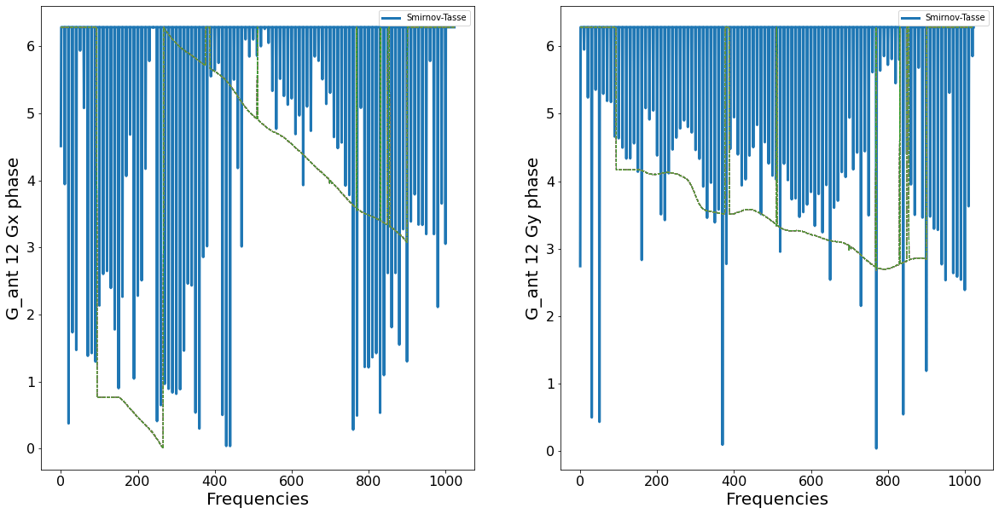

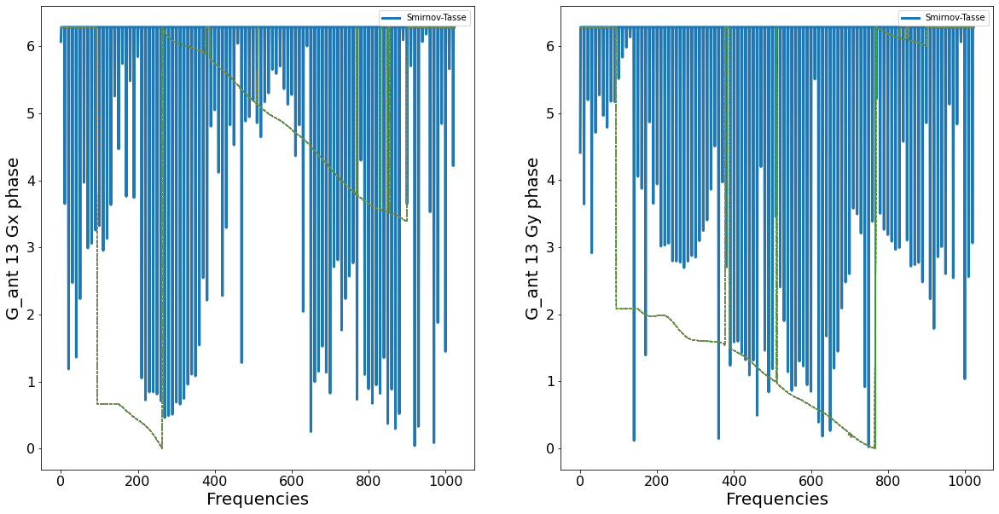

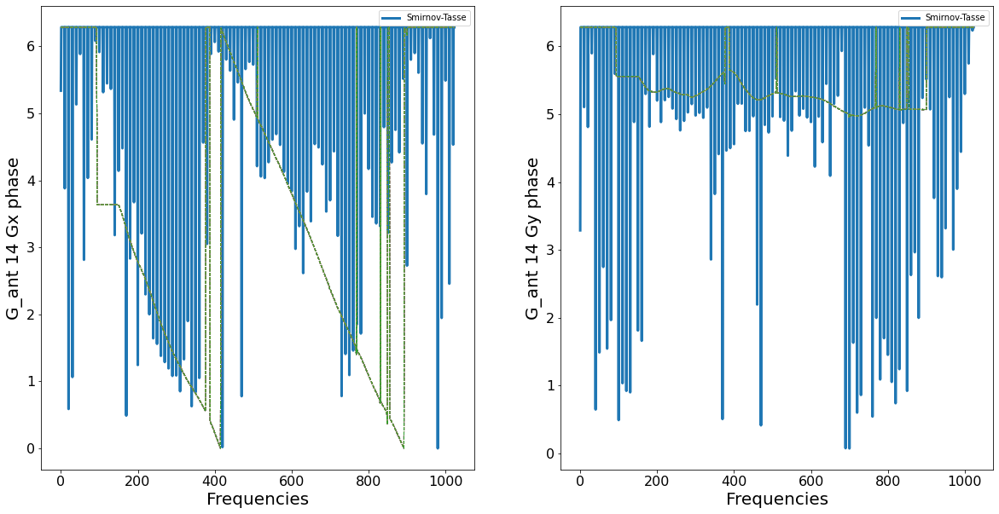

In [26]:
for ant_index in range(gain_info.shape[0]):
    fig, axes = plt.subplots(figsize=(20,10), ncols=2)
    
    ax = axes[0]
    angle_ = np.angle(gain_info[ant_index,:,0,0])-np.angle(gain_info[0,:,0,0])
    angle_[angle_<=0.] += 2*np.pi          
    ax.plot(angle_, lw=3, label="Smirnov-Tasse")
    angle_ = np.angle(uv_cal.gain_array[ant_index,0,:,:,0])-np.angle(uv_cal.gain_array[0,0,:,:,0])
    angle_[angle_<=0.] += 2*np.pi
    ax.plot(angle_, "--", lw=1)
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} Gx phase".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')
    
    ax = axes[1]
    angle_ = np.angle(gain_info[ant_index,:,1,1])-np.angle(gain_info[0,:,1,1])
    angle_[angle_<=0.] += 2*np.pi  
    ax.plot(angle_, lw=3, label="Smirnov-Tasse")
    angle_ = np.angle(uv_cal.gain_array[ant_index,0,:,:,1])-np.angle(uv_cal.gain_array[0,0,:,:,1])
    angle_[angle_<=0.] += 2*np.pi  
    ax.plot(angle_, "--", lw=1)
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} Gy phase".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')

### old version

In [18]:
gain_info = np.load("gain_info_HERA19.npy")

In [20]:
gain_rp = polcal.gain_array_interpolate(gain_info, list(range(0,1024,10)), approach='real_imag')

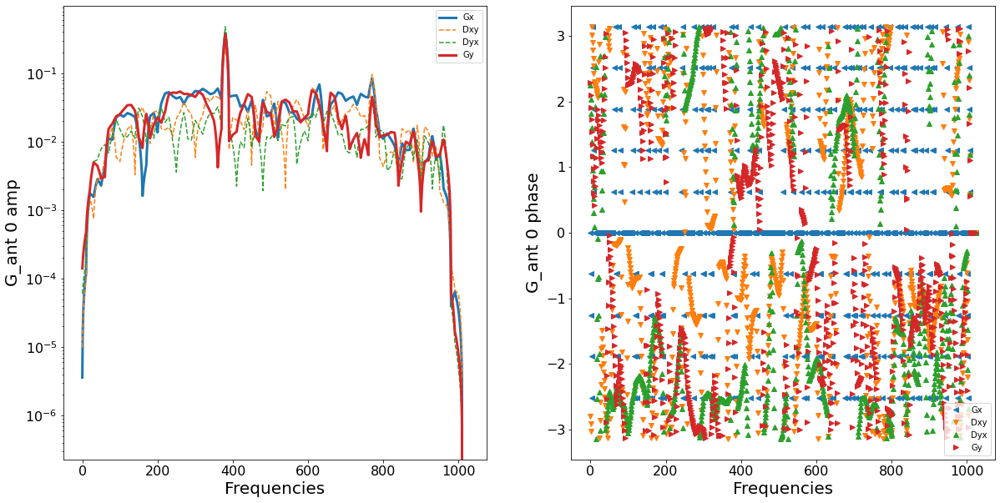

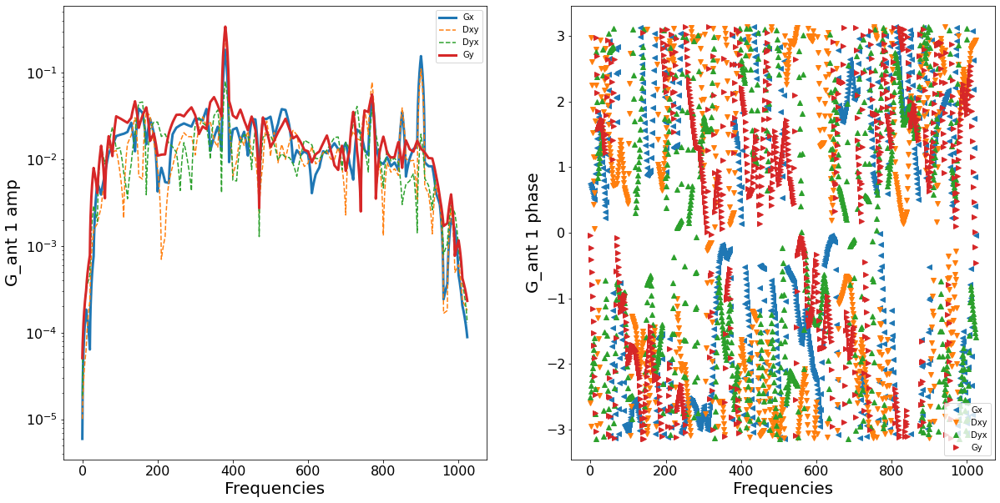

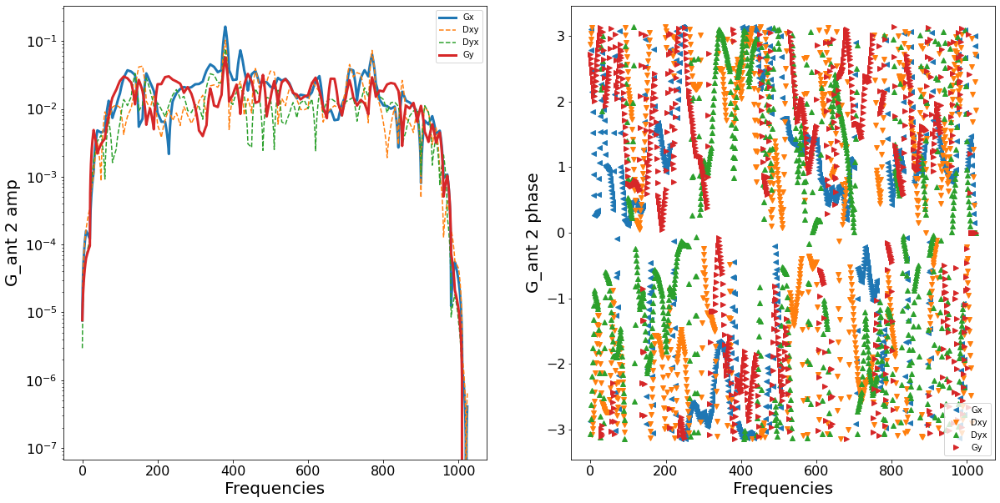

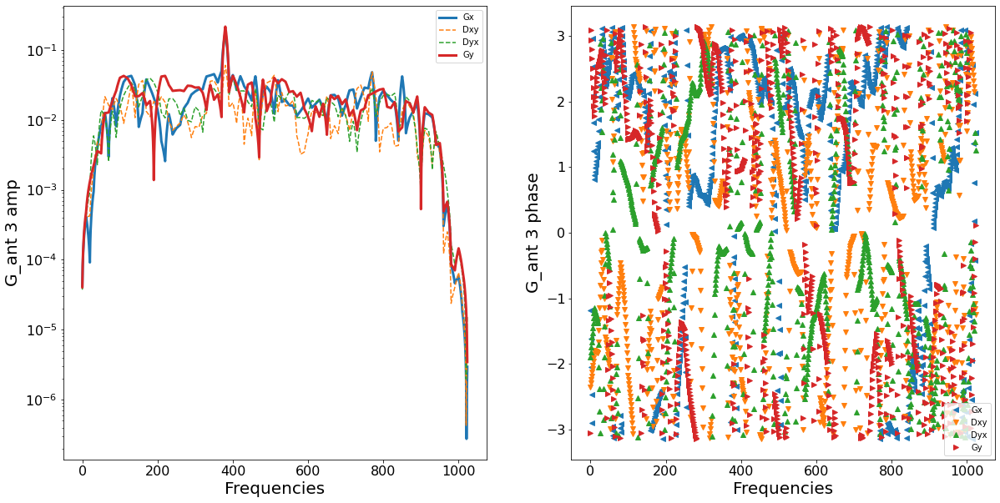

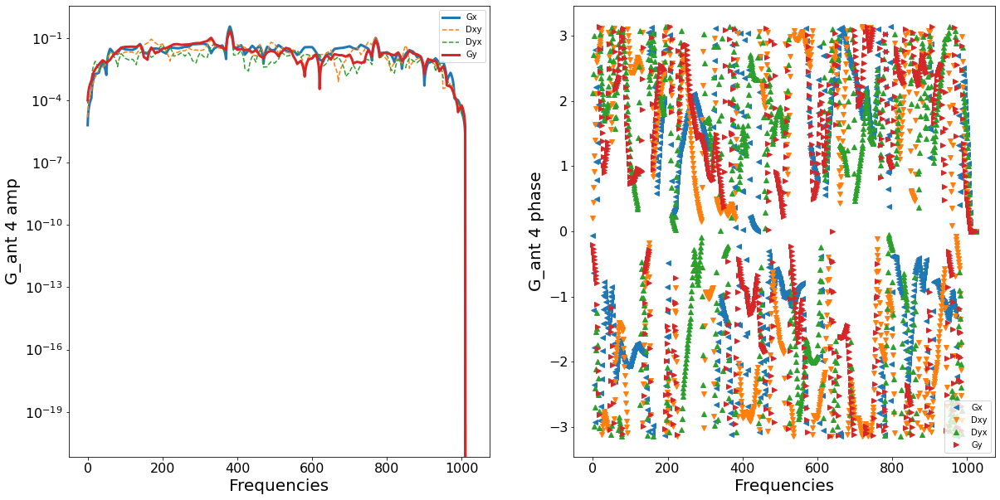

...

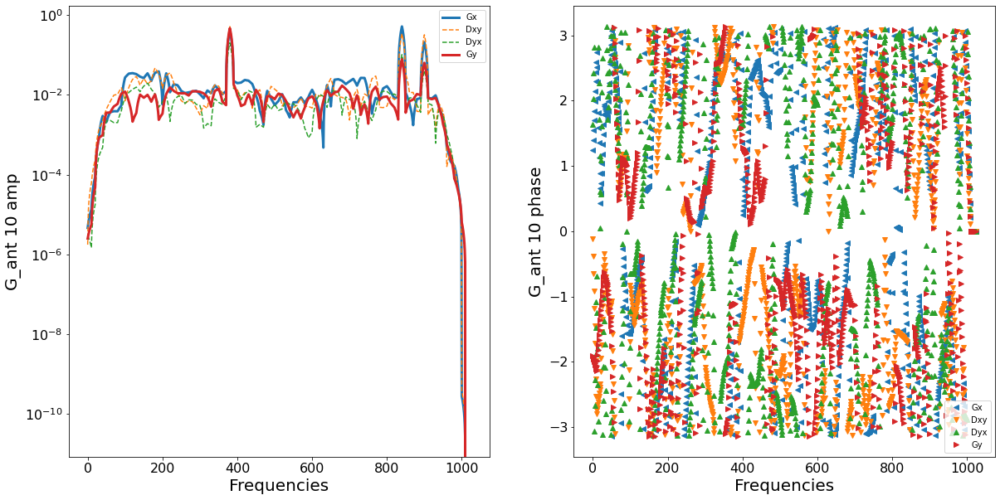

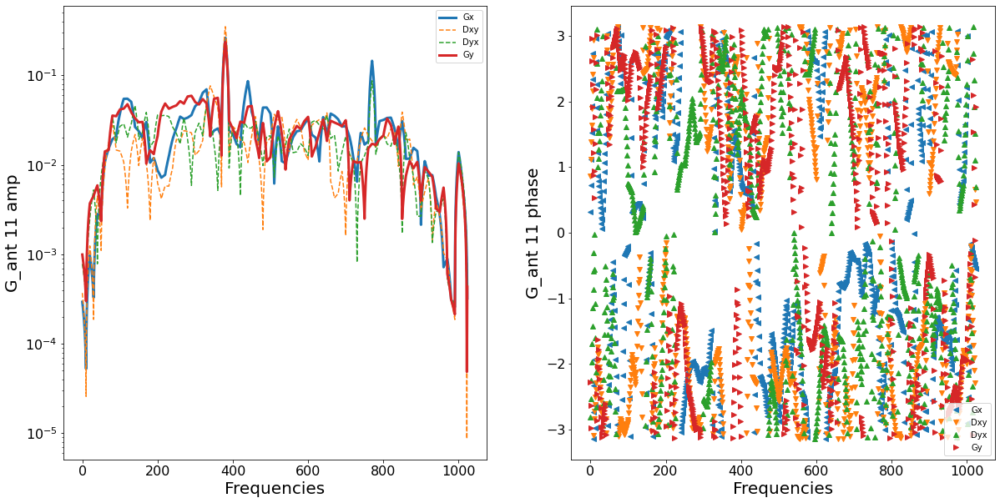

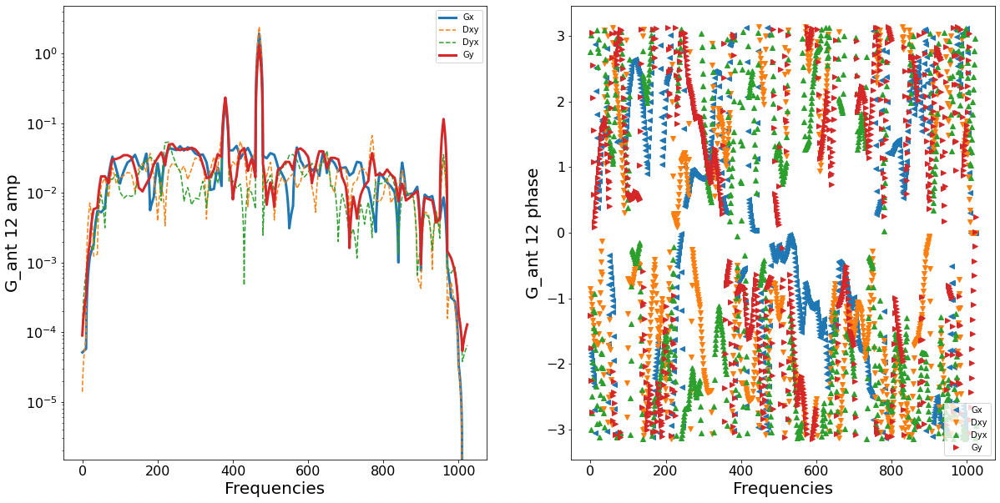

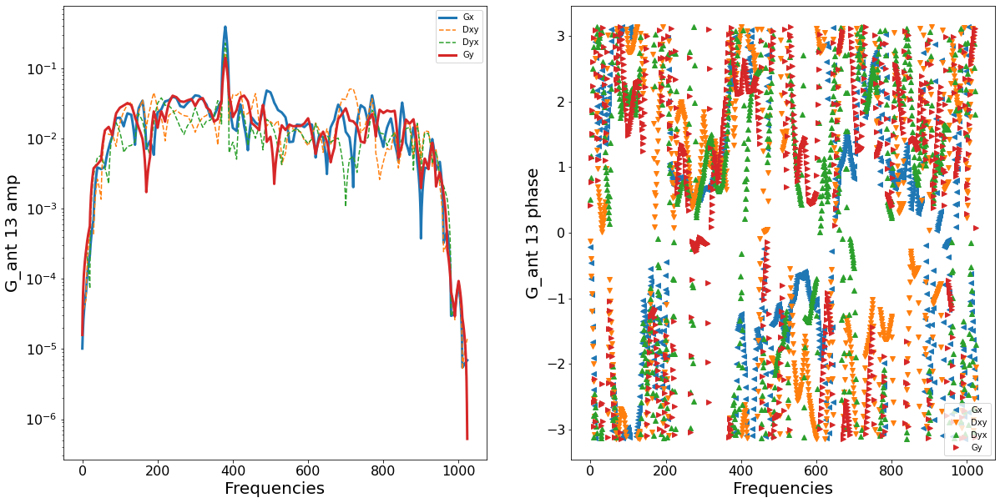

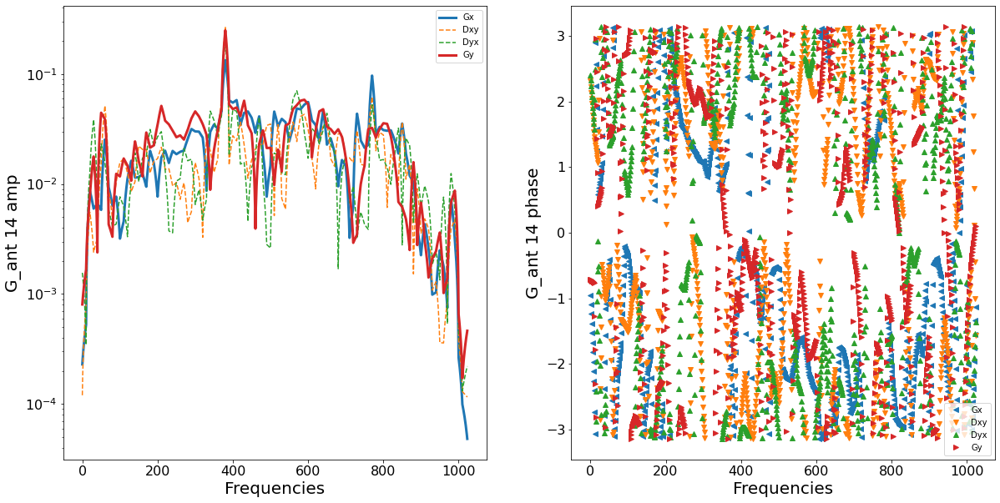

In [69]:
for ant_index in range(gain_info.shape[0]):
    fig, axes = plt.subplots(figsize=(20,10), ncols=2)
    
    ax = axes[0]
    ax.plot(abs(gain_rp[ant_index,:,0,0]), lw=3, label="Gx")
    ax.plot(abs(gain_rp[ant_index,:,0,1]), "--", label="Dxy")
    ax.plot(abs(gain_rp[ant_index,:,1,0]), "--", label="Dyx")
    ax.plot(abs(gain_rp[ant_index,:,1,1]), lw=3, label="Gy")
    ax.set_yscale('log')
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} amp".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')
    
    ax = axes[1]
    ax.plot(np.angle(gain_rp[ant_index,:,0,0]), "<", label="Gx")
    ax.plot(np.angle(gain_rp[ant_index,:,0,1]), "v",label="Dxy")
    ax.plot(np.angle(gain_rp[ant_index,:,1,0]), "^",label="Dyx")
    ax.plot(np.angle(gain_rp[ant_index,:,1,1]), ">",label="Gy")
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} phase".format(ant_index), fontsize=20)
    ax.legend(loc='lower right')

#### distribution of residuals 
$n_{ij} = d_{ij} - g_i m_{ij} g_j$

In [70]:
uvd_raw_ = uvd_raw.select(time_range=[2457548.166989404, 2457548.1721047065], inplace=False)

In [71]:
uvd_sim_ = uvd_sim.select(time_range=[2457755.599121639, 2457755.6042191857], inplace=False)

In [72]:
uvc = polcal.apply_gains(uvd_sim_, gain_rp, need_inverse=False)

In [73]:
residual_array = uvd_raw_.data_array - uvc.data_array

In [74]:
from scipy import stats

Text(0.1, 0.8, 'Vyy Real')

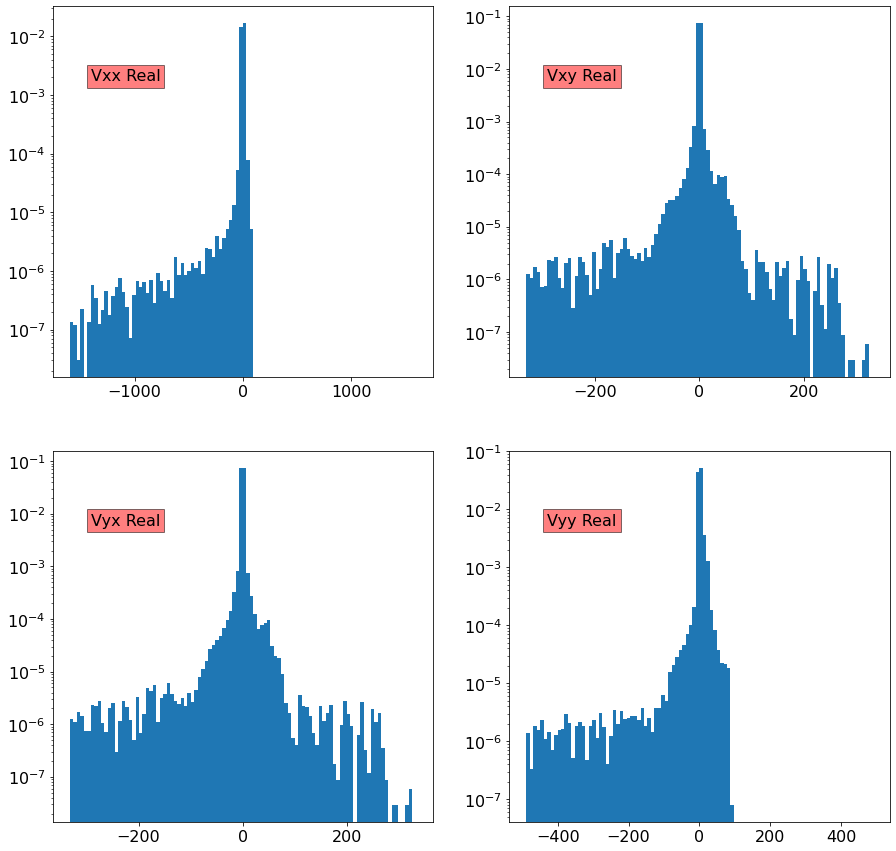

In [75]:
fig, axes = plt.subplots(figsize=(15,15), ncols=2, nrows=2)

ax = axes[0,0]
d = np.real((residual_array[:,:,:,0]).flatten())
sigma = np.std(d)
n, bins, patches = ax.hist(d, bins=100, range=(-4*sigma, 4*sigma), density=True)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.text(0.1,0.8, "Vxx Real", bbox=dict(facecolor='red', alpha=0.5), transform=ax.transAxes, fontsize=16, color='k')

ax = axes[0,1]
d = np.real((residual_array[:,:,:,2]).flatten())
sigma = np.std(d)
ax.hist(d, bins=100, range=(-4*sigma, 4*sigma), density=True)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.text(0.1,0.8, "Vxy Real", bbox=dict(facecolor='red', alpha=0.5), transform=ax.transAxes, fontsize=16, color='k')

ax = axes[1,0]
d = np.real((residual_array[:,:,:,3]).flatten())
sigma = np.std(d)
ax.hist(d, bins=100, range=(-4*sigma, 4*sigma), density=True)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.text(0.1,0.8, "Vyx Real", bbox=dict(facecolor='red', alpha=0.5), transform=ax.transAxes, fontsize=16, color='k')

ax = axes[1,1]
d = np.real((residual_array[:,:,:,1]).flatten())
sigma = np.std(d)
ax.hist(d, bins=100, range=(-4*sigma, 4*sigma), density=True)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.text(0.1,0.8, "Vyy Real", bbox=dict(facecolor='red', alpha=0.5), transform=ax.transAxes, fontsize=16, color='k')

Text(0.1, 0.8, 'Vyy Imag')

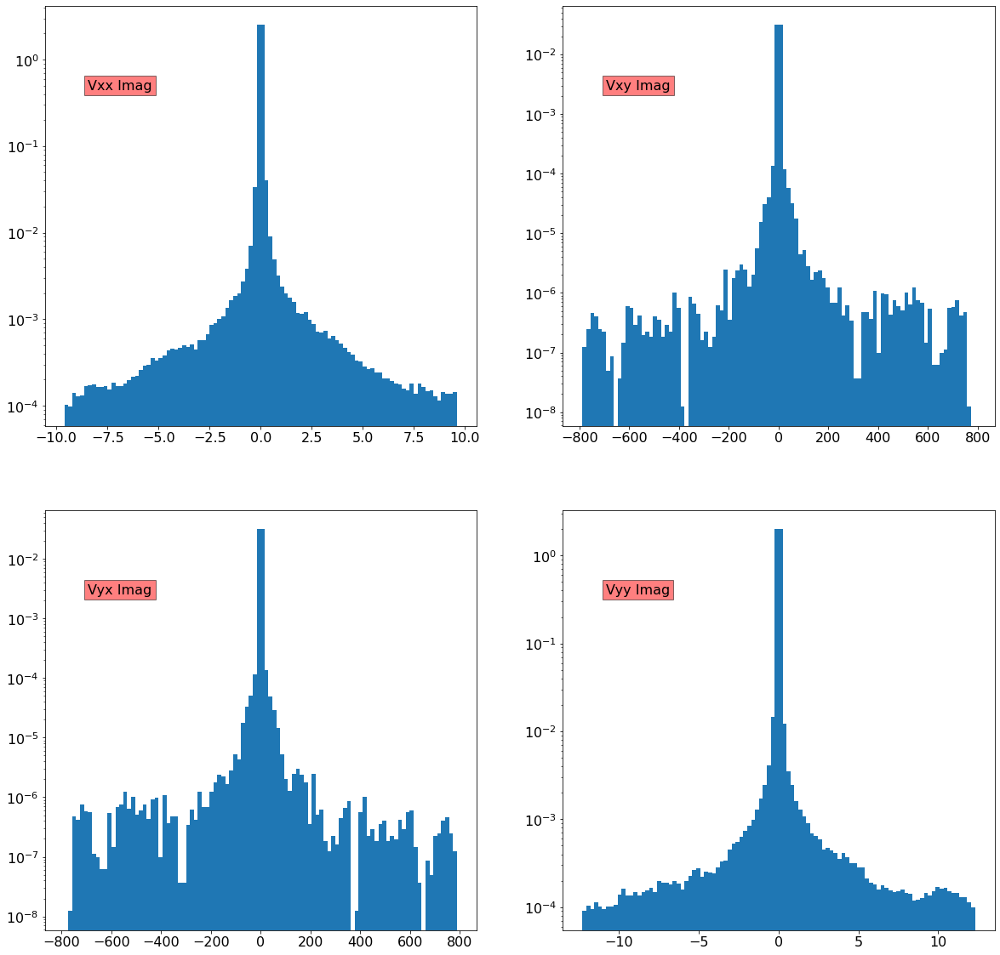

In [76]:
fig, axes = plt.subplots(figsize=(20,20), ncols=2, nrows=2)

ax = axes[0,0]
d = np.imag((residual_array[:,:,:,0]).flatten())
sigma = np.std(d)
ax.hist(d, bins=100, range=(-4*sigma, 4*sigma), density=True)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.text(0.1,0.8, "Vxx Imag", bbox=dict(facecolor='red', alpha=0.5), transform=ax.transAxes, fontsize=16, color='k')

ax = axes[0,1]
d = np.imag((residual_array[:,:,:,2]).flatten())
sigma = np.std(d)
ax.hist(d, bins=100, range=(-4*sigma, 4*sigma), density=True)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.text(0.1,0.8, "Vxy Imag", bbox=dict(facecolor='red', alpha=0.5), transform=ax.transAxes, fontsize=16, color='k')

ax = axes[1,0]
d = np.imag((residual_array[:,:,:,3]).flatten())
sigma = np.std(d)
ax.hist(d, bins=100, range=(-4*sigma, 4*sigma), density=True)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.text(0.1,0.8, "Vyx Imag", bbox=dict(facecolor='red', alpha=0.5), transform=ax.transAxes, fontsize=16, color='k')

ax = axes[1,1]
d = np.imag((residual_array[:,:,:,1]).flatten())
sigma = np.std(d)
ax.hist(d, bins=100, range=(-4*sigma, 4*sigma), density=True)
ax.set_yscale('log')
ax.tick_params(axis='both', which='both', labelsize=16)
ax.text(0.1,0.8, "Vyy Imag", bbox=dict(facecolor='red', alpha=0.5), transform=ax.transAxes, fontsize=16, color='k')

#### comparison to other gains

In [78]:
uv_cal = UVCal()
uv_cal.read_calfits("/lustre/aoc/projects/hera/jaguirre/HERA19Summer2020/RawData/2457548/zen.2457548.16694.uvcRP.calfits")
uv_cal.select(antenna_nums=good_ants, times=uv_cal.time_array[:42])

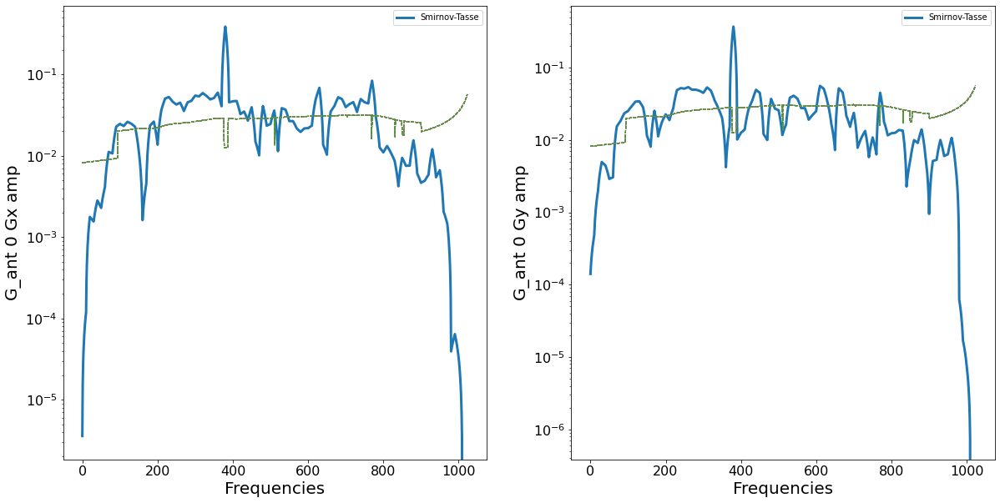

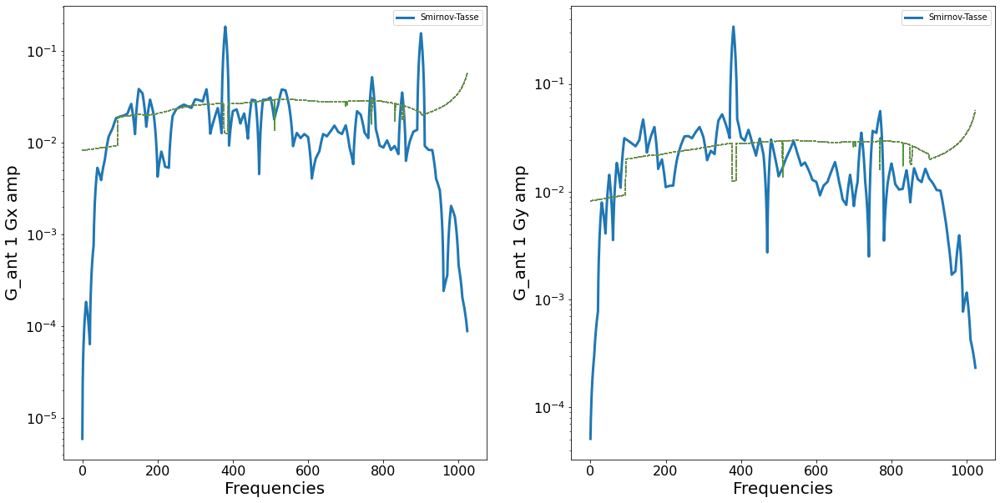

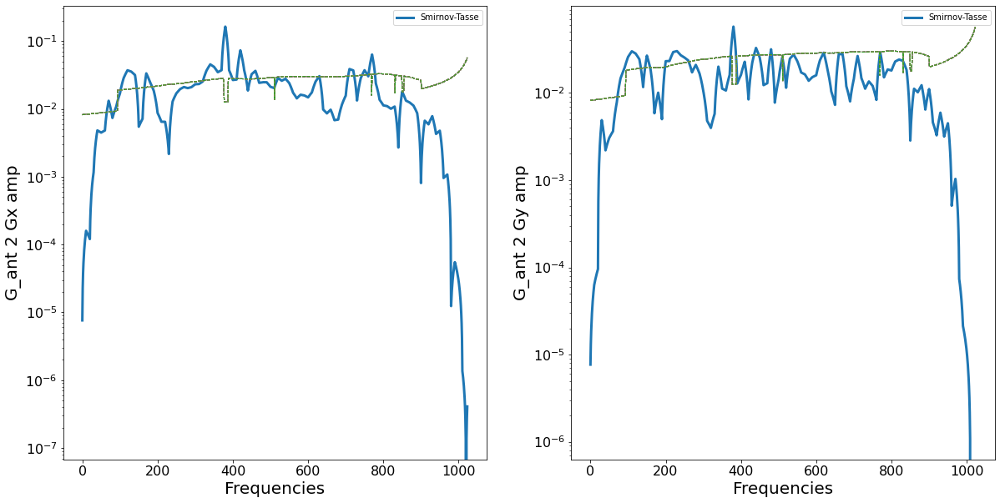

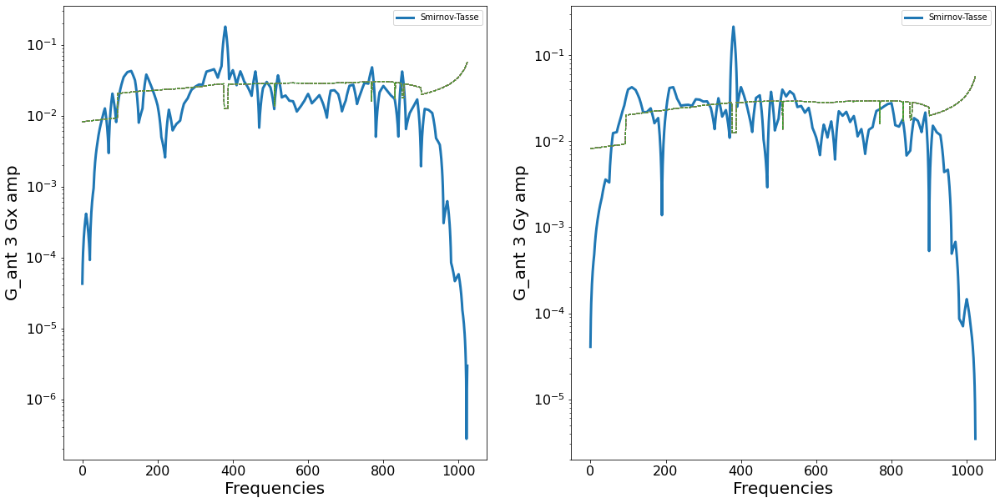

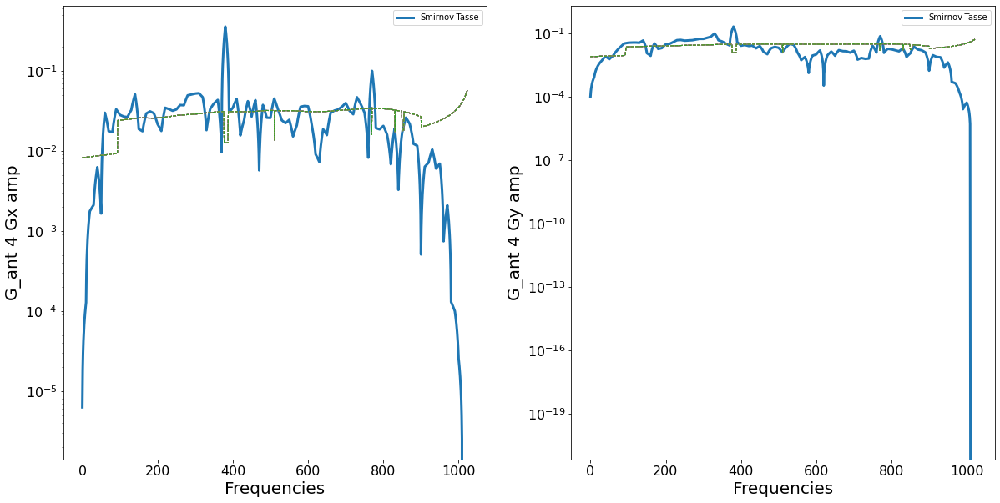

...

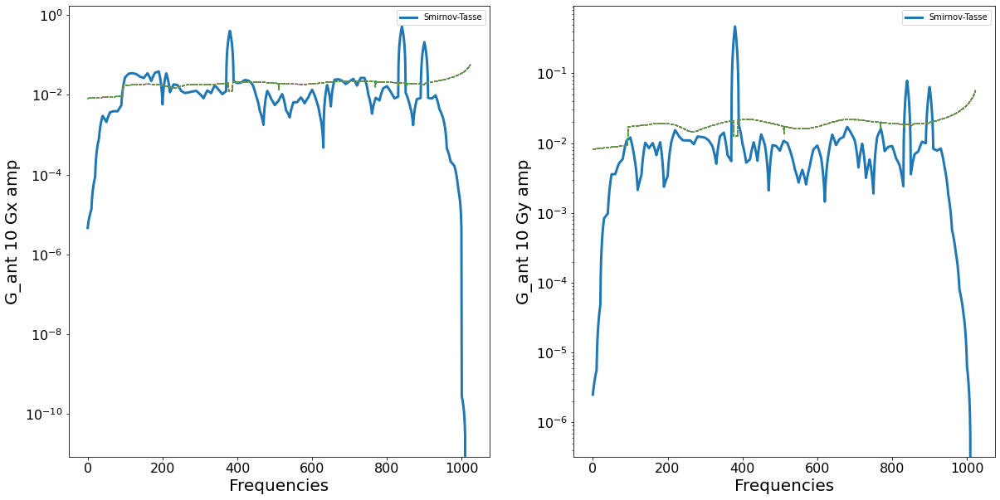

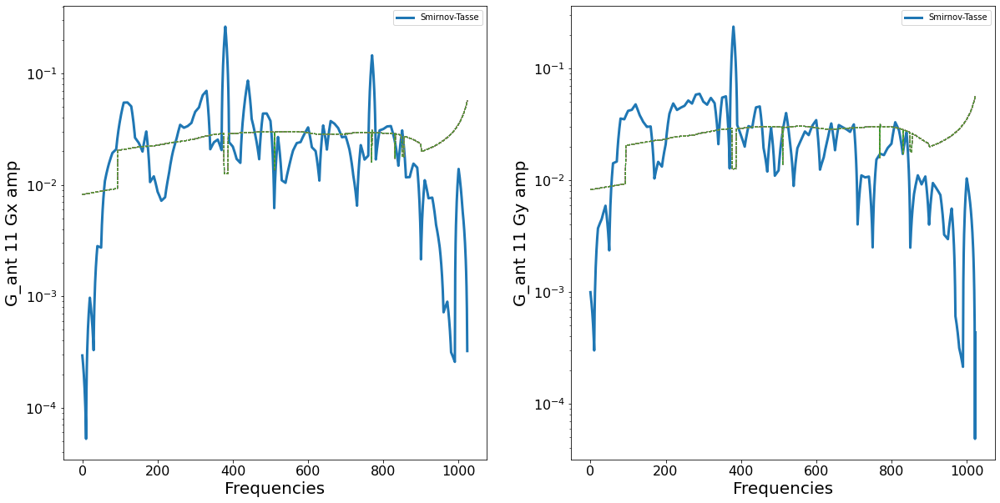

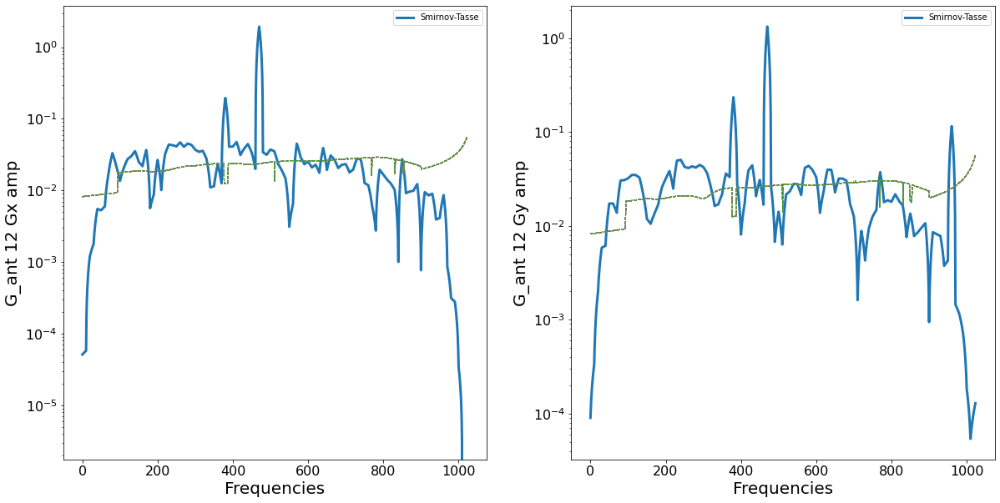

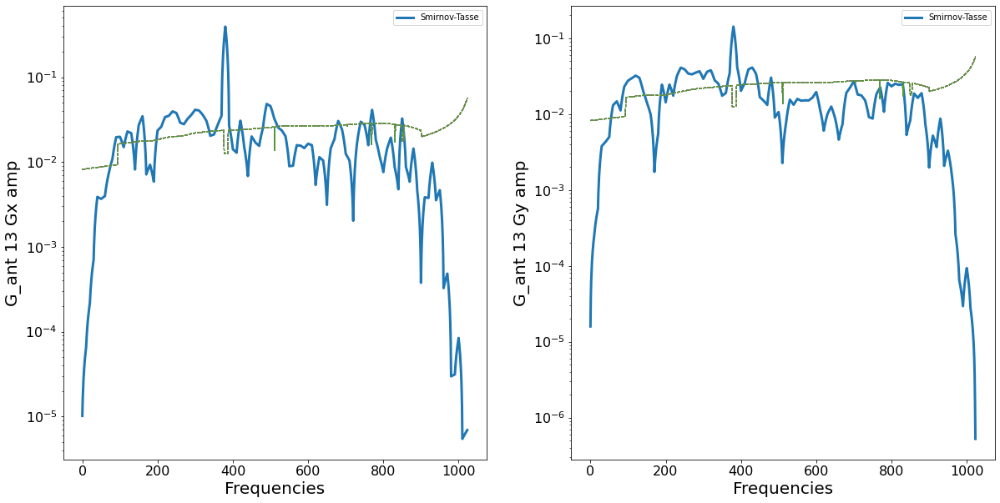

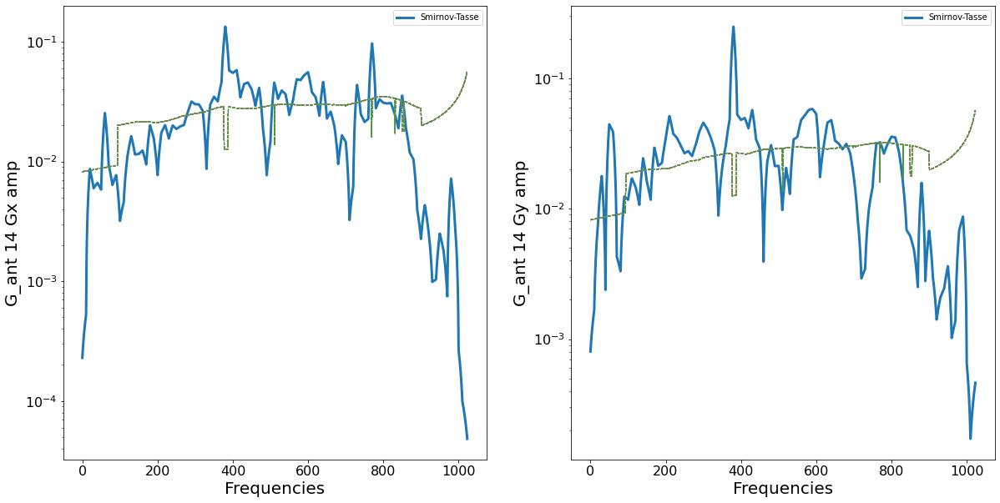

In [79]:
for ant_index in range(gain_info.shape[0]):
    fig, axes = plt.subplots(figsize=(20,10), ncols=2)
    
    ax = axes[0]
    ax.plot(abs(gain_rp[ant_index,:,0,0]), lw=3, label="Smirnov-Tasse")
    ax.plot(abs(uv_cal.gain_array[ant_index,0,:,:,0]), "--", lw=1)
    ax.set_yscale('log')
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} Gx amp".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')
    
    ax = axes[1]
    ax.plot(abs(gain_rp[ant_index,:,1,1]), lw=3, label="Smirnov-Tasse")
    ax.plot(abs(uv_cal.gain_array[ant_index,0,:,:,1]), "--", lw=1)
    ax.set_yscale('log')
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} Gy amp".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')
    

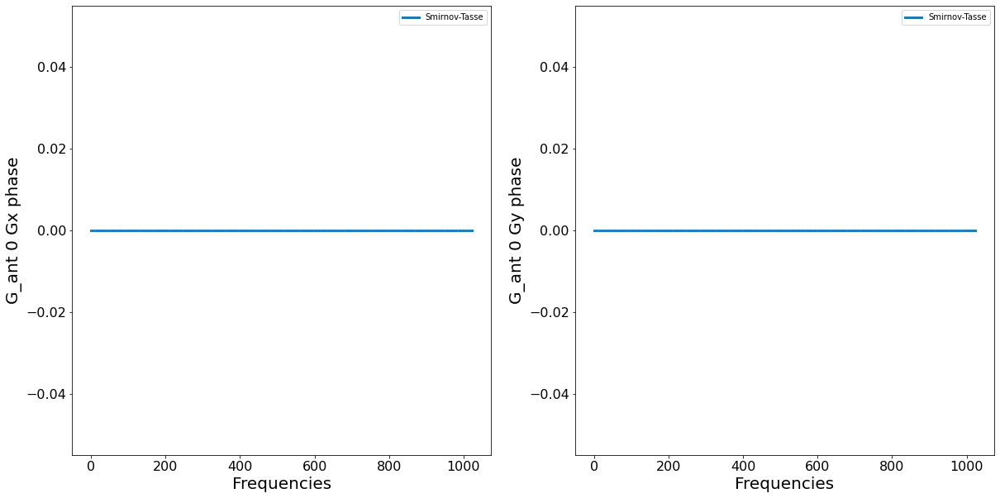

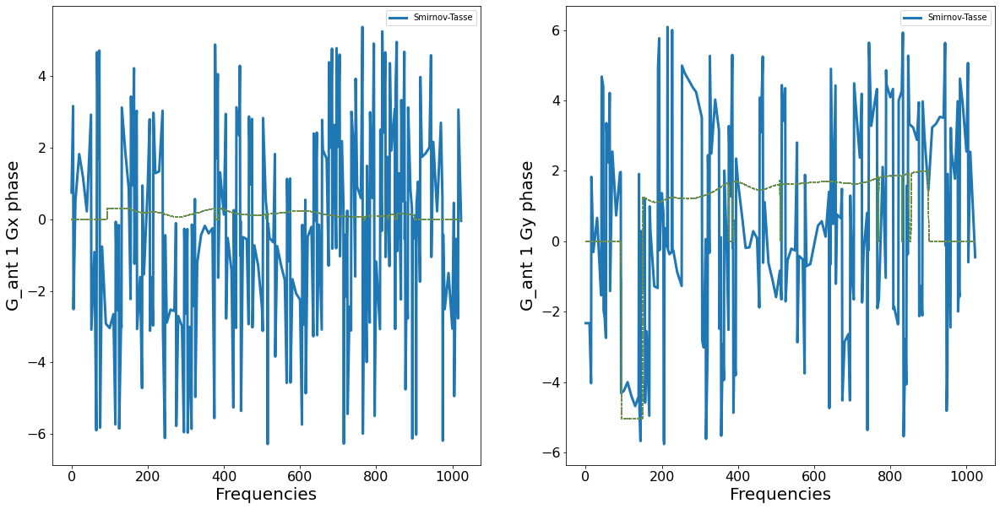

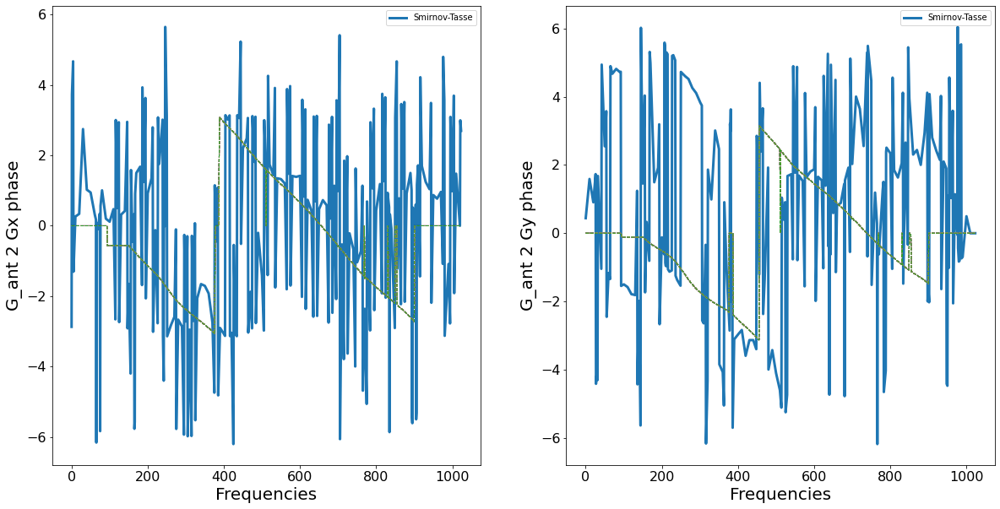

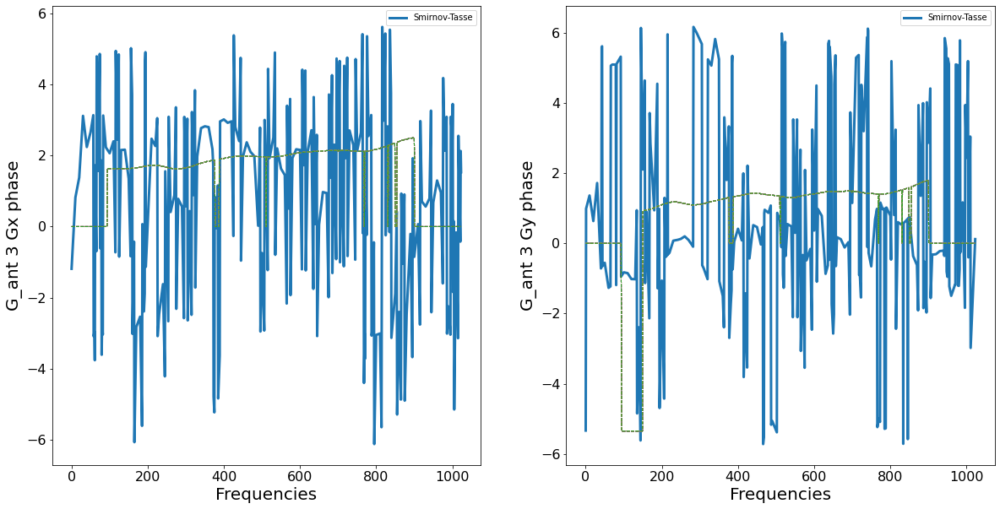

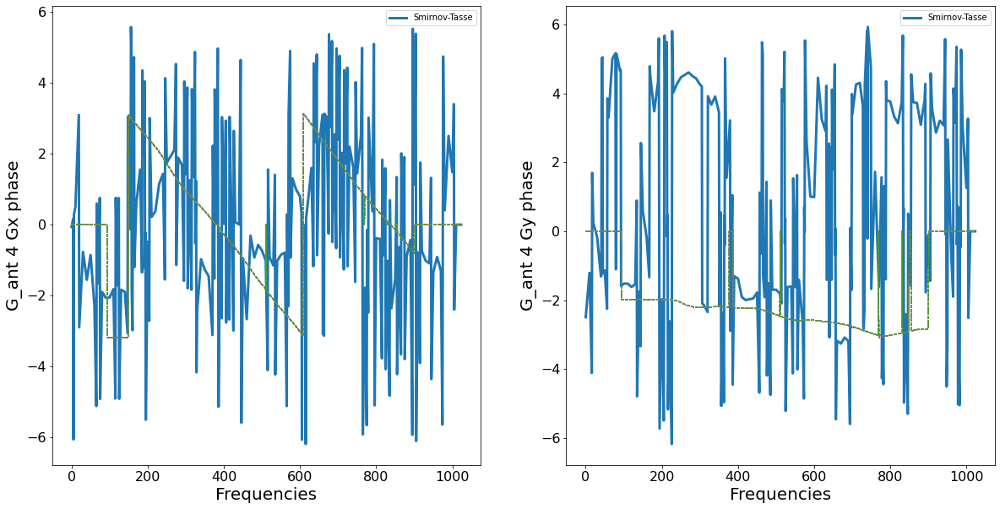

...

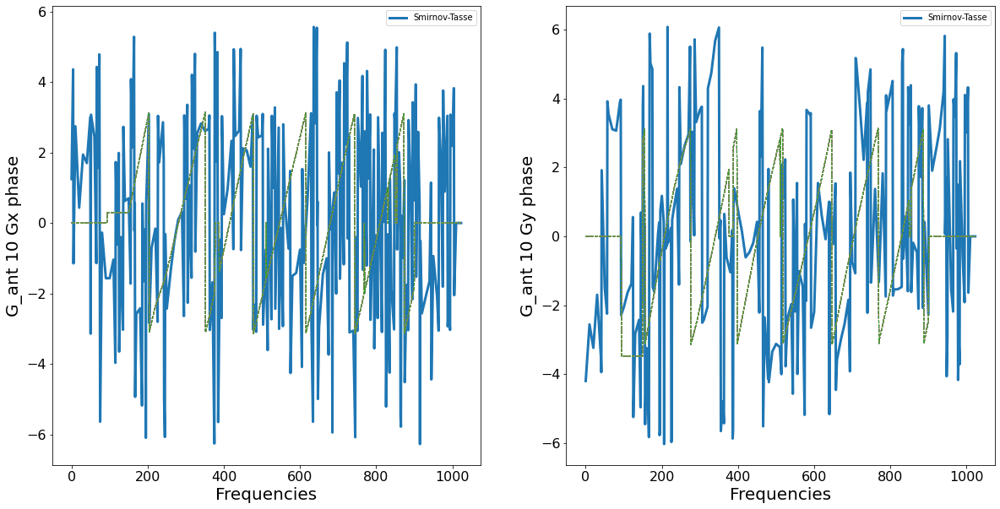

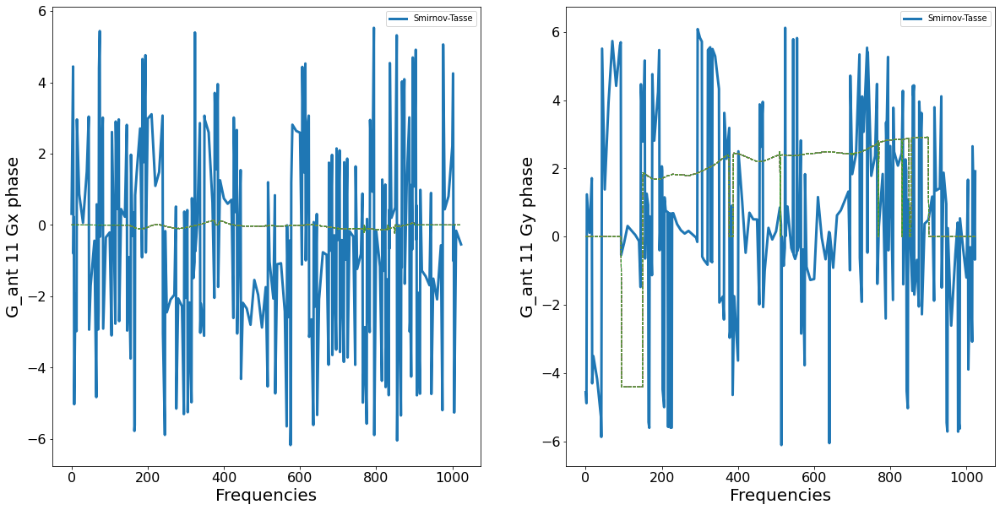

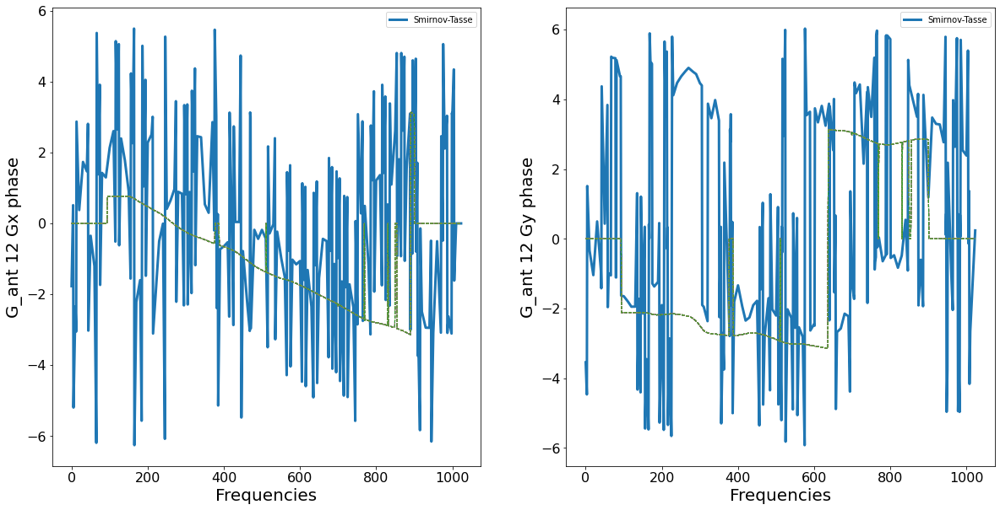

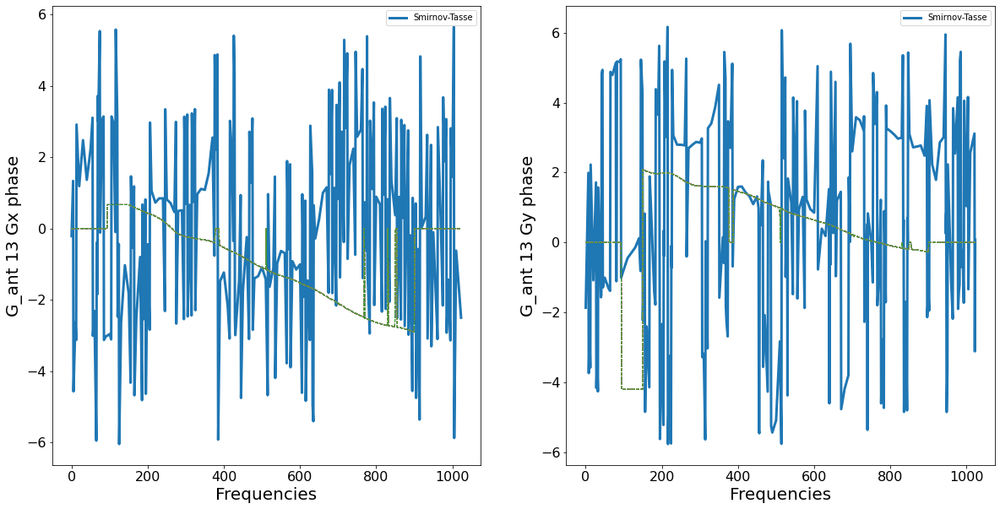

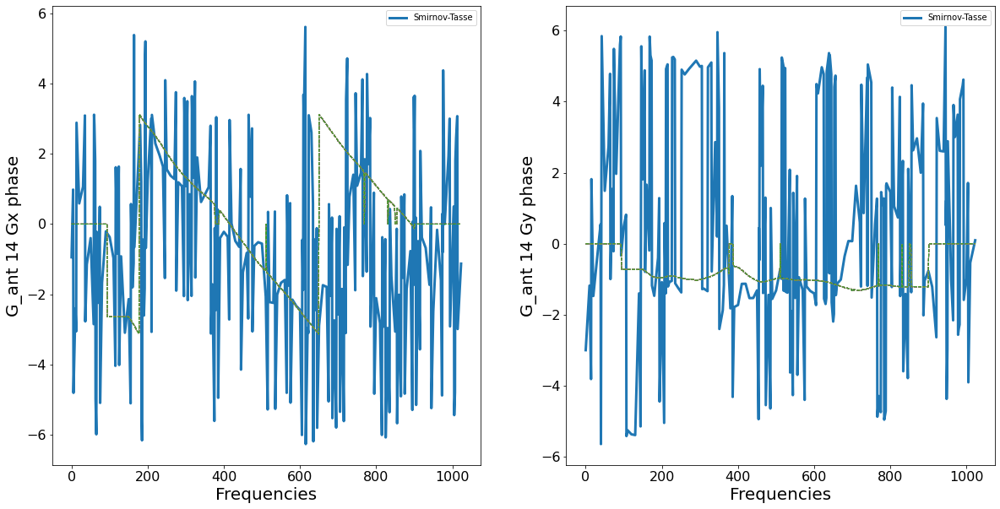

In [81]:
for ant_index in range(gain_info.shape[0]):
    fig, axes = plt.subplots(figsize=(20,10), ncols=2)
    
    ax = axes[0]
    ax.plot(np.angle(gain_rp[ant_index,:,0,0])-np.angle(gain_rp[0,:,0,0]), lw=3, label="Smirnov-Tasse")
    ax.plot(np.angle(uv_cal.gain_array[ant_index,0,:,:,0])-np.angle(uv_cal.gain_array[0,0,:,:,0]), "--", lw=1)
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} Gx phase".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')
    
    ax = axes[1]
    ax.plot(np.angle(gain_rp[ant_index,:,1,1])-np.angle(gain_rp[0,:,1,1]), lw=3, label="Smirnov-Tasse")
    ax.plot(np.angle(uv_cal.gain_array[ant_index,0,:,:,1])-np.angle(uv_cal.gain_array[0,0,:,:,1]), "--", lw=1)
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_xlabel("Frequencies", fontsize=20)
    ax.set_ylabel("G_ant {} Gy phase".format(ant_index), fontsize=20)
    ax.legend(loc='upper right')